# Importing Libs

In [1]:
import pandas as pd
import numpy as np
import re

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import collections
import nltk
from nltk.corpus import stopwords 
from nltk.stem.wordnet import WordNetLemmatizer
from wordcloud import WordCloud
# nltk.download() # descomente para instalar pacotes

pd.options.plotting.backend = "plotly"
pd.options.display.max_columns = None

# Functions

In [2]:
def df_shape(df):
    print('Linhas:', df.shape[0])
    print('Colunas:', df.shape[1])

def Limpeza_cols(instancia):
    instancia = re.sub(r"", "", instancia).lower().replace('-','_')\
    .replace(':','').replace('+','').replace('<','').replace('>','')\
    .replace('#','').replace('$','').replace('&','').replace('*','').replace('á','a').replace('é','e').replace('í','i')\
    .replace('ó','o').replace('ú','u').replace('ã','a').replace('õ','o').replace('â','a').replace('ê','e')\
    .replace('ô','o').replace('û','u').replace('?','').replace('.','_').replace('/','_').replace('\\','').replace('ç','c')\
    .replace(' ','_').replace('º','o').replace('ª','a')
    return (instancia)

def Limpeza_coments(instancia):
    instancia = re.sub(r"", "", instancia).lower().replace('-','_')\
    .replace(':','').replace('+','').replace('<','').replace('>','').replace(',','')\
    .replace('#','').replace('$','').replace('&','').replace('*','').replace('á','a').replace('é','e').replace('í','i')\
    .replace('ó','o').replace('ú','u').replace('ã','a').replace('õ','o').replace('â','a').replace('ê','e')\
    .replace('ô','o').replace('û','u').replace('?','').replace('.','').replace('/','').replace('\\','').replace('ç','c')\
    .replace('º','o').replace('ª','a')
    return (instancia)

def info_basica(df):
    print("========================================================================================================")
    print("Colunas:")
    print(df.columns)
    print("--------------------------------------------------------------------------------------------------------")
    print("Tamanho DataFrame:")
    print(df_shape(df))
    print("--------------------------------------------------------------------------------------------------------")
    print("Informações Gerais:")
    print(df.info())
    print("--------------------------------------------------------------------------------------------------------")
    print("Valores nulos:")
    print(df.isnull().sum())
    print("--------------------------------------------------------------------------------------------------------")
    try:
        print("Estatística num:")
        print(df.describe(include='number'))
    except:
        print('O conjunto não possui dados numéricos')
    print("--------------------------------------------------------------------------------------------------------")
    try:
        print("Estatística cat:")
        print(df.describe(exclude='number'))
    except:
        print('O conjunto não possui dados categóricos')
    print("--------------------------------------------------------------------------------------------------------")
    print("========================================================================================================")
    
def wordcloud(df, name_col_coment):

    df_coments = pd.DataFrame(df[[name_col_coment]])
    df_coments[name_col_coment] = [Limpeza_coments(i) for i in df_coments[name_col_coment]]
    df_coments.drop(df_coments.loc[df_coments[name_col_coment]=='sem dado'].index, axis=0, inplace=True)
    df_coments[name_col_coment] = df_coments[name_col_coment].str.replace('_','')
    
    Limpeza_common_words_pt(df_coments, name_col_coment)
    word_list = df_coments[name_col_coment].values.tolist()
    words = [palavra for lista in word_list for palavra in lista]
    freq_words = collections.Counter(words)

    word_list = []
    freq_list = []

    for i, j in freq_words.items():
        word_list.append(i)
        freq_list.append(j)

    df_words_freq = pd.DataFrame({'word': word_list, 'freq': freq_list})
    df_words_freq.sort_values('freq', ascending=False, inplace=True)

    nuvem = WordCloud(min_font_size = 3,  max_words = 150 , width = 1200 , height = 600).generate(" ".join(df_words_freq))
    plt.figure(figsize=(6,3), dpi=300)
    nuvem.generate_from_frequencies(dict(df_words_freq.values))
    plt.imshow(nuvem)
    plt.axis('off')  # Para nao mostrar eixos
    
    
    return plt.show(), df_words_freq.head(10)
    
def Limpeza_common_words_pt(df, col):
    common_words = stopwords.words('portuguese')
    lista_aux = df[col].str.split()
    for i, _ in df.iterrows():
        df[col].at[i] = [word for word in lista_aux[i] \
                             if word not in common_words]

# Data Extract

In [3]:
df_churn = pd.read_csv('churn_trat.csv', sep=',', encoding='utf-8')
df_churn.drop('Unnamed: 0', axis=1, inplace=True)
df_churn.head(3)

,cd_cnta,nm_cnta,cd_contrato,cd_item,cd_planilha,ds_seg_cnta,ds_prod,dt_compet,canc_mensal,tipo_cancel,lin_receita,tipo_motivo,motivo_agrup,nome_oferta,marca_totvs,vertical,unid_agrup,acionavel,motivo_pai,porte_mrr,propensao_20210312,tipo_cliente,cliente_moni,estado,faixa_faturamento,codigo_guarda_chuva,uso_perc_produto,dt_assinatura,tempo_contrato_(m),tempo_contrato_(a),ano_cancel,tri_cancel,migrado_intera,usa_cloud,usa_servicos,canc_mensal_10,protheus,totvs_full_light,rm,datasul,logix,ls_2010_2011,pims,sara,dt_compet_fe,master_key,churn
0,T00053,GUERBET PRODUTOS RADIOLOGICOS LIMITADA,CONT00053,31,99,MANUFATURA,totvs-smart-analytics--pack-10,2019-08-01,3999.85,PARCIAL,SUBSCRIÇÃO,Motivos Externos,Incorporação,SMART ANALYTICS,GOODDATA,SUPPLY,DRG: RIO DE JANEIRO - RECEITAS,Pouco acionável,Administrativo,10K < MRR <= 50K,PROPENSÃO MÉDIA,Padrao,Nao,RJ,Faixa 05 - De 35 M até 50 M,T00053,5.97,2017-04-24,27.0,2.0,2019,3T19,0,1,0,0,1,1,0,1,0,0,0,0,2019-08,CONT00053T00053totvs-smart-analytics--pack-10,1
1,T00082,HOERBIGER TURBOTECH SERVICOS DE ENGENHARIA LTDA,CONT00082,2,3,CONSTRUCAO E PROJETOS,sms-light-erp-trad,2019-06-01,4107.57,PARCIAL,MANUTENCAO,Motivos Externos,Dificuldade Financeira,LIGHT TRADICIONAL,TRADICIONAL,SERVICES,FRANQUIAS GRANDES,Pouco acionável,Financeiro,5K < MRR <= 10K,PROPENSÃO MÉDIA,Padrao,Nao,SP,Faixa 04 - De 25 M até 35 M,T00082,8.46,2010-07-06,107.0,8.0,2019,2T19,0,1,0,0,0,1,1,1,0,0,0,0,2019-06,CONT00082T00082sms-light-erp-trad,1
2,T00082,HOERBIGER TURBOTECH SERVICOS DE ENGENHARIA LTDA,CONT00082,7,3,CONSTRUCAO E PROJETOS,sms-lgt-g.-cap-humano-trad,2019-11-01,356.99,PARCIAL,MANUTENCAO,Motivos Externos,Dificuldade Financeira,LIGHT G. CAP HUMANO,TRADICIONAL,SERVICES,FRANQUIAS GRANDES,Pouco acionável,Financeiro,5K < MRR <= 10K,PROPENSÃO MÉDIA,Padrao,Nao,SP,Faixa 04 - De 25 M até 35 M,T00082,8.46,2018-06-02,20.0,1.0,2019,4T19,0,1,0,0,0,1,1,1,0,0,0,0,2019-11,CONT00082T00082sms-lgt-g.-cap-humano-trad,1


In [4]:
df_nps = pd.read_csv('nps_trat.csv', sep=',', encoding='utf-8')
df_nps.drop('ID', axis=1, inplace=True)
df_nps.head()

,cod_cliente,data_hora_da_opiniao,data_hora_da_opiniao_fe,decisor_de_compra,cod_unidade,unidade_responsavel,nome_do_negocio,segmento,macrosegmento,avaliacao_unidade_responsavel,vale_a_pena,entrega_de_beneficio_do_software,produto_1,nota,comentario,justificativas,tempo_resposta_total_seg_fe,churn_nps,avaliacao_unidade_responsavel_fe,nota_fe
0,T47497,2021-01-21 08:32:00,2021-01,Recomendo ou avalio,TSE340,TOTVS BAHIA_ILHEUS,SOFTWARE,VAREJO,CONSUMER,8.0,Não Sabe,SEM DADO,RM - TOTVS Backoffice,7,SEM DADO,CUSTOS - valor das licenças,236.0,1,neutro,neutro
1,TD0547,2021-01-08 16:50:00,2021-01,Recomendo ou avalio,TSL160,CIANORTE,SOFTWARE VIRTUAL AGE,VAREJO,CONSUMER,7.0,Sim,Entregou Totalmente,VIRTUAL AGE - TOTVS Moda,7,Ter um atendimento telefônico que eu possa con...,SUPORTE TÉCNICO - não concorda com os procedim...,304.0,0,neutro,neutro
2,TD0095,2021-01-08 16:39:00,2021-01,Recomendo ou avalio,CVA002,CIANORTE,SOFTWARE VIRTUAL AGE,VAREJO,CONSUMER,10.0,Sim,Entregou Totalmente,VIRTUAL AGE - TOTVS Moda,10,SEM DADO,NÃO INFORMADO,76.0,1,promotor,promotor
3,TFBZNC,2021-01-08 16:38:00,2021-01,Recomendo ou avalio,TSE106,TOTVS SUL FLUMINENSE,SOFTWARE,SERVICOS,SERVICES,9.0,Sim,Entregou Parcialmente,PROTHEUS - TOTVS Backoffice,9,SEM DADO,NÃO INFORMADO,1459.0,0,promotor,promotor
4,TFCGT2,2021-01-08 16:34:00,2021-01,Recomendo ou avalio,TCO006,TOTVS GOIANIA (PC SISTEMAS - S.FORCE),SOFTWARE PC SISTEMAS,VAREJO,CONSUMER,8.0,Sim,Entregou Totalmente,PC SISTEMAS - TOTVS Distribuição e Varejo (Lin...,10,"A questão do atendimento, pois quando precisa ...",SUPORTE TÉCNICO - dificuldade de contato\nSUPO...,684.0,0,neutro,promotor


In [5]:
df_zendesk = pd.read_csv('zendesk_trat.csv', sep=',', encoding='utf-8')
df_zendesk.drop(['Unnamed: 0', 'index'], axis=1, inplace=True)
df_zendesk.head(3)

C:\Users\Araka\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3169: DtypeWarning: Columns (9) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,codigo_organizacao,data_criacao_fe,nome_grupo_fe,tipo_ticket,prioridade_ticket,status_ticket,titulo_ticket,cd_cnta,churn
0,TWGGAA,2019-03,PRODUTO,QUESTION,LOW,CLOSED,RESERVAS FORAM CONFIRMADAS PORÉM O HOTEL NÃO T...,NaN,0.0
1,TWGGAA,2021-03,CST,SEM DADO,SEM DADO,SEM DADO,SEM DADO,NaN,0.0
2,TWGGAA,2021-03,CST,SEM DADO,SEM DADO,SEM DADO,SEM DADO,NaN,0.0


In [6]:
df_zendesk_mod_c = pd.read_csv('zendesk_mod_c_trat.csv', sep=',', encoding='utf-8')
df_zendesk_mod_c.drop('ID', axis=1, inplace=True)
df_zendesk_mod_c.head()

,codigo_organizacao,data_criacao_fe,cloud,cst,cx,ouvidoria,produto,ti,incident,problem,question,sem_dado_tipo_ticket,task,high,low,normal,sem_dado_priori_ticket,urgent,closed,deleted,hold,new,open,pending,sem_dado_status_ticket,solved
0,T00035,2018-03,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0
1,T00035,2018-09,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0
2,T00035,2019-08,0,2,0,0,0,0,0,0,2,0,0,1,0,1,0,0,2,0,0,0,0,0,0,0
3,T00035,2020-05,0,3,0,0,0,0,0,0,1,2,0,0,0,1,2,0,1,0,0,0,0,0,2,0
4,T00035,2020-07,0,0,0,0,2,0,0,0,0,2,0,0,0,0,2,0,0,0,0,0,0,0,2,0


In [7]:
df_zendesk_mod_nc = pd.read_csv('zendesk_mod_nc_trat.csv', sep=',', encoding='utf-8')
df_zendesk_mod_nc.drop('ID', axis=1, inplace=True)
df_zendesk_mod_nc.head()

,codigo_organizacao,data_criacao_fe,cloud,cst,cx,ouvidoria,produto,ti,incident,problem,question,sem_dado_tipo_ticket,task,high,low,normal,sem_dado_priori_ticket,urgent,closed,deleted,hold,new,open,pending,sem_dado_status_ticket,solved
0,SEM DADO,2018-01,4838,66930,0,219,27462,8315,1612,1784,77489,22668,4211,27056,18293,36604,23020,2791,106942,697,28,0,0,1,96,0
1,SEM DADO,2018-02,4524,36642,0,200,26424,8037,1517,1575,54759,14491,3485,16574,14881,26703,14867,2802,75634,108,13,0,1,1,70,0
2,SEM DADO,2018-03,4959,15279,0,235,26550,8999,1827,1621,41004,7963,3607,4716,12047,27889,8452,2918,55698,204,33,0,0,1,83,3
3,SEM DADO,2018-04,4584,17953,0,216,25597,8568,1899,1614,40143,9565,3697,8254,11220,28662,6055,2727,56366,402,44,4,0,0,101,1
4,SEM DADO,2018-05,5579,21163,0,207,24979,8609,1478,1687,47643,6145,3584,13200,11359,32278,962,2738,60135,257,33,0,1,0,110,1


In [8]:
df_zendesk_mod = pd.read_csv('zendesk_mod_trat.csv', sep=',', encoding='utf-8')
df_zendesk_mod.drop('ID', axis=1, inplace=True)
df_zendesk_mod.head()

,codigo_organizacao,data_criacao_fe,cloud,cst,cx,ouvidoria,produto,ti,incident,problem,question,sem_dado_tipo_ticket,task,high,low,normal,sem_dado_priori_ticket,urgent,closed,deleted,hold,new,open,pending,sem_dado_status_ticket,solved
0,SEM DADO,2018-01,4838,66930,0,219,27462,8315,1612,1784,77489,22668,4211,27056,18293,36604,23020,2791,106942,697,28,0,0,1,96,0
1,SEM DADO,2018-02,4524,36642,0,200,26424,8037,1517,1575,54759,14491,3485,16574,14881,26703,14867,2802,75634,108,13,0,1,1,70,0
2,SEM DADO,2018-03,4959,15279,0,235,26550,8999,1827,1621,41004,7963,3607,4716,12047,27889,8452,2918,55698,204,33,0,0,1,83,3
3,SEM DADO,2018-04,4584,17953,0,216,25597,8568,1899,1614,40143,9565,3697,8254,11220,28662,6055,2727,56366,402,44,4,0,0,101,1
4,SEM DADO,2018-05,5579,21163,0,207,24979,8609,1478,1687,47643,6145,3584,13200,11359,32278,962,2738,60135,257,33,0,1,0,110,1


In [9]:
df_contrato = pd.read_csv('contrato_trat.csv', sep=',', encoding='utf-8')
df_contrato.head()

C:\Users\Araka\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3169: DtypeWarning: Columns (14,15) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,Unnamed: 0,nr_cont,cd_cli_destino,nr_proposta,hospedagem,nm_vendedor,nm_gar,nm_unde_canal,nm_unde_vnda,cd_cli,nm_cli,cnpj,cidade,uf,cep,pais,ds_segmento,ds_subsegmento,ds_cnae,fat_estimado,metrica_inf,metrica_dec,metrica_inf_dec,metrica_tipo,fat_origem,fat_faixa,cd_prod,ds_prod,cd_gp,ds_gp,gp_recorrente,cd_lin_rec,ds_lin_rec,agrupamento,agrupamento_meta,modalidade,seg_totvs,seg_intera,licenciamento,grp_solucao,marca_totvs,tab_prc,area_resp,modal_comerc,abrangencia,nm_oferta_sb1,dt_assinatura_contrato,dt_proposta,dt_upload,qtd,vl_incremento_total,vl_total_contrato,vl_unitario,periodicidade,situacao_contrato,sts_contrato,dt_refer_prod,recorrente,ds_nm_oferta,familia,tp_crm_2,dt_prim_contrato,tp_tcfgd,tp_final,ordem,tp_inicial,tp_cli,tp_vnda,erp,fluig,gooddata,backoffice,segmentos,rh,grp_solucao_combinado,grp_solucao_erp,tem_erp,tem_fluig,tem_gooddata,tem_backoffice,tem_segmentos,tem_rh,cliente_novo_intera,tipo_cliente_intera,pacote_complementar,totvs_cloud_pacote_complementar,cloud,app,tem_app,recorrente_total_cloud,recorrente_app,recorrente_intera,fat_estimado_orbis,dt_assinatura_contrato_fe,div_periodicidade_aux,vl_total_contrato_fe,cd_cnta,churn_cliente,master_key,churn_contrato,porte_mrr_aux,porte_mrr
0,0,CONTB2557,TB2557,970182,SEM DADO,ERICO CARDOZO DE OLIVEIRA,CRISTIANO NOVAK,TOTVS SANTA CATARINA,TOTVS SANTA CATARINA,TB2557,MC COMERCIO DE COSMETICOS PERFUMARIA E HIGIENE...,13487524000109,ITAJAI,SC,88301041,105,VAREJO,DROGARIA,"Comercio varejista de cosmeticos, produtos de ...","Faixa 00 - Até 4,5 M",SEM DADO,SEM DADO,SEM DADO,SEM DADO,ESTIMADA,"Faixa 00 - Até 4,5 M",PCSF.15,suporte-usuario-winthor,0342,SFW SMS PC SISTEMAS - S.FORCE,Sim,303,SMS TOTVS SERIE T,0303-SMS TOTVS SERIE T,"SMS SERIE 3,SMS SERIE T, PROGRESS",TRADICIONAL,SEM DADO,SEM DADO,manutencao,ERP,PC SISTEMAS,LEGADO - INATIVO,V&D - DISTRIBUIÇÃO,NOVOS NEGÓCIOS,SMB,TOTVS DISTRIBUICAO E VAREJO (LINHA WINTHOR),2018-06-12,2018-06-12,2018-06-12,1.0,0.0,101.29,101.29,00 - Mensal,ATIVO,000 - NORMAL,1900-01-01,Sim,SEM DADO,SEM DADO,SEM DADO,SEM DADO,SEM DADO,SEM DADO,3.0,SEM DADO,SEM DADO,SEM DADO,0.0,0.0,0.0,0.0,0.0,0.0,Novo Intera Fluig + GoodData,Novo Intera Fluig + GoodData,0.0,0.0,0.0,0.0,0.0,0.0,Não tem Novo Intera,SEM DADO,0.0,0.0,SEM DADO,0.0,Sem APP,0.0,0.0,0.0,"Faixa 01 - Até 7,5 M",2018-06,1,101.29,TB2557,1.0,CONTB2557TB2557suporte-usuario-winthor,0.0,4615.15,1k <= MRR < 5K
1,1,CONT78362,T78362,99999X,SEM DADO,POOL DE CONTAS,GAR TESTE,TOTVS NAO ENCONTRADA - META A DISTRIBUIR,TOTVS - METAS BI - MATRIZ,T78362,VICTOR CEZAR PRIORI,111479568,JATAI,GO,75801701,105,EDUCACIONAL,BASICO,PESSOA FISICA (SEM CNAE),SEM DADO,SEM DADO,SEM DADO,SEM DADO,SEM DADO,ESTIMADA,Sem Informações de Faturamento,DTMA.MMI.E2.TE,sms-sms-industrial-ems2,0172,SMS TRADIC DTS EMBUTIDA,Sim,303,SMS TOTVS SERIE T,0303-SMS TOTVS SERIE T,"SMS SERIE 3,SMS SERIE T, PROGRESS",TRADICIONAL,SEM DADO,SEM DADO,manutencao,ERP,TRADICIONAL,SEM DADO,SEM DADO,TRADICIONAL,SEM DADO,LIGHT TRADICIONAL,2004-11-05,SEM DADO,SEM DADO,1.0,0.0,0.01,0.01,00 - Mensal,CANCELADO,003 - CANCELADO,1900-01-01,Sim,SEM DADO,TRADICIONAL,SEM DADO,SEM DADO,NOVO,NOVO,2.0,2.0,Novo,NOVO,0.0,0.0,0.0,0.0,0.0,0.0,Novo Intera Fluig + GoodData,Novo Intera Fluig + GoodData,0.0,0.0,0.0,0.0,0.0,0.0,Não tem Novo Intera,SEM DADO,0.0,0.0,SEM DADO,0.0,SEM DADO,0.0,0.0,0.0,Sem Informações de Faturamento,2004-11,1,0.01,NaN,0.0,CONT78362T78362sms-sms-industrial-ems2,0.0,0.29,MRR < 1K
2,2,CONT60284,T60284,399870,SEM DADO,YURI SEIXAS FERREIRA,PAULO JOSE COSTA DE ARAUJO,TOTVS RIO DE JANEIRO,TOTVS RIO DE JANEIRO,T60284,TESS INDUSTRIA E COMERCIO LTDA,09130858000145,CAMPINA GRANDE,PB,58411170,105,MANUFATURA,BENS DE CONSUMO,Fabricacao de calcados de materiais nao especi...,Faixa 07 - De 75 M até 150 M,SEM DADO,SEM DADO,SEM DADO,SEM DADO,ESTIMADA,Faixa 07 - De 75 M até 150 M,1111001000-6,sms-full-totvs-trad,11T1,SOFTWARE - SMS - SERIE T - TRA,Sim,303,SMS TOTVS SERIE T,0303-SMS TOTVS SERIE T,"SMS SERIE 3,SMS SERIE T, PROGRESS",TRADICIONAL,SEM DADO,SEM DADO,

# Basic Informations

## Churn

In [10]:
info_basica(df_churn)

Colunas:
Index(['cd_cnta', 'nm_cnta', 'cd_contrato', 'cd_item', 'cd_planilha',
       'ds_seg_cnta', 'ds_prod', 'dt_compet', 'canc_mensal', 'tipo_cancel',
       'lin_receita', 'tipo_motivo', 'motivo_agrup', 'nome_oferta',
       'marca_totvs', 'vertical', 'unid_agrup', 'acionavel', 'motivo_pai',
       'porte_mrr', 'propensao_20210312', 'tipo_cliente', 'cliente_moni',
       'estado', 'faixa_faturamento', 'codigo_guarda_chuva',
       'uso_perc_produto', 'dt_assinatura', 'tempo_contrato_(m)',
       'tempo_contrato_(a)', 'ano_cancel', 'tri_cancel', 'migrado_intera',
       'usa_cloud', 'usa_servicos', 'canc_mensal_10', 'protheus',
       'totvs_full_light', 'rm', 'datasul', 'logix', 'ls_2010_2011', 'pims',
       'sara', 'dt_compet_fe', 'master_key', 'churn'],
      dtype='object')
--------------------------------------------------------------------------------------------------------
Tamanho DataFrame:
Linhas: 39010
Colunas: 47
None
---------------------------------------------------

## Zendesk

In [11]:
info_basica(df_zendesk)

Colunas:
Index(['codigo_organizacao', 'data_criacao_fe', 'nome_grupo_fe', 'tipo_ticket',
       'prioridade_ticket', 'status_ticket', 'titulo_ticket', 'cd_cnta',
       'churn'],
      dtype='object')
--------------------------------------------------------------------------------------------------------
Tamanho DataFrame:
Linhas: 12515851
Colunas: 9
None
--------------------------------------------------------------------------------------------------------
Informações Gerais:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12515851 entries, 0 to 12515850
Data columns (total 9 columns):
 #   Column              Dtype  
---  ------              -----  
 0   codigo_organizacao  object 
 1   data_criacao_fe     object 
 2   nome_grupo_fe       object 
 3   tipo_ticket         object 
 4   prioridade_ticket   object 
 5   status_ticket       object 
 6   titulo_ticket       object 
 7   cd_cnta             object 
 8   churn               float64
dtypes: float64(1), object(8)
memory usa

In [12]:
info_basica(df_zendesk_mod_c)

Colunas:
Index(['codigo_organizacao', 'data_criacao_fe', 'cloud', 'cst', 'cx',
       'ouvidoria', 'produto', 'ti', 'incident', 'problem', 'question',
       'sem_dado_tipo_ticket', 'task', 'high', 'low', 'normal',
       'sem_dado_priori_ticket', 'urgent', 'closed', 'deleted', 'hold', 'new',
       'open', 'pending', 'sem_dado_status_ticket', 'solved'],
      dtype='object')
--------------------------------------------------------------------------------------------------------
Tamanho DataFrame:
Linhas: 180891
Colunas: 26
None
--------------------------------------------------------------------------------------------------------
Informações Gerais:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180891 entries, 0 to 180890
Data columns (total 26 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   codigo_organizacao      180891 non-null  object
 1   data_criacao_fe         180891 non-null  object
 2   cloud       

In [13]:
info_basica(df_zendesk_mod_nc)

Colunas:
Index(['codigo_organizacao', 'data_criacao_fe', 'cloud', 'cst', 'cx',
       'ouvidoria', 'produto', 'ti', 'incident', 'problem', 'question',
       'sem_dado_tipo_ticket', 'task', 'high', 'low', 'normal',
       'sem_dado_priori_ticket', 'urgent', 'closed', 'deleted', 'hold', 'new',
       'open', 'pending', 'sem_dado_status_ticket', 'solved'],
      dtype='object')
--------------------------------------------------------------------------------------------------------
Tamanho DataFrame:
Linhas: 555742
Colunas: 26
None
--------------------------------------------------------------------------------------------------------
Informações Gerais:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 555742 entries, 0 to 555741
Data columns (total 26 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   codigo_organizacao      555742 non-null  object
 1   data_criacao_fe         555742 non-null  object
 2   cloud       

## Contratos

In [14]:
# info_basica(df_contrato)

# EDA

In [15]:
def Agrupador_churn_zd(var_gb, lista_cols):
    return df_churn_zd.groupby(var_gb).sum()[lista_cols]

def Agrupador_churn_zd_com(var_gb, lista_cols):
    return df_churn_zd_com.groupby(var_gb).sum()[lista_cols]

def Agrupador_nchurn_zd(var_gb, lista_cols):
    return df_nchurn_zd.groupby(var_gb).sum()[lista_cols]

def Grafico_churn_zd(var_gb, anot, title):
    fig = go.Figure()
    for i in var_gb.columns:
        fig.add_trace(go.Bar(x=var_gb.index.values, 
                         y=var_gb[i].values, 
                         name=i, text=var_gb[i]))
    if anot == 'sim':
        fig.update_traces(texttemplate='%{text:.3s}', textposition='inside')

    fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'}, title_text=title)
#     fig.write_html('graficos_insights/grafico_'+title+'.html')
    fig.show()
    
def Grafico_churn_zd_h(var_gb, anot, title):
    fig = go.Figure()
    for i in var_gb.columns:
        fig.add_trace(go.Bar(y=var_gb.index.values, 
                         x=var_gb[i].values, 
                         name=i, text=var_gb[i], orientation='h'))
    if anot == 'sim':
        fig.update_traces(texttemplate='%{text:.3s}', textposition='inside')

    fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'}, title_text=title)
#     fig.write_html('graficos_insights/grafico_'+title+'.html')
    fig.show()

ls_grupos = ['cloud','cst','cx','ouvidoria','produto','ti']
ls_priori = ['high','low','normal','sem_dado_priori_ticket','urgent']
ls_tp_tkt = ['incident','problem','question','sem_dado_tipo_ticket','task']
ls_status_tkt = ['urgent','closed','deleted','hold','new','open','pending','sem_dado_status_ticket','solved']

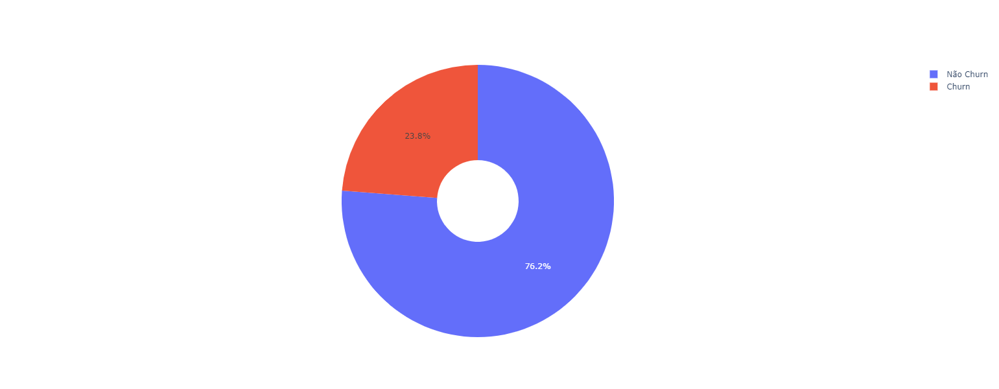

In [16]:
labels = ['Não Churn','Churn']

fig = go.Figure(data=[go.Pie(labels=labels, values=df_zendesk['churn'].value_counts(), hole=.3)])
fig.update_layout(width=600, height=600)
fig.show()

In [17]:
df_churn[['cd_cnta', 'porte_mrr', 'ds_seg_cnta', 'motivo_pai']]\
.merge(df_zendesk.groupby('codigo_organizacao').sum(), left_on='cd_cnta', right_on='codigo_organizacao', how='left').dropna()

,cd_cnta,porte_mrr,ds_seg_cnta,motivo_pai,churn
0,T00053,10K < MRR <= 50K,MANUFATURA,Administrativo,2493.0
1,T00082,5K < MRR <= 10K,CONSTRUCAO E PROJETOS,Financeiro,38.0
2,T00082,5K < MRR <= 10K,CONSTRUCAO E PROJETOS,Financeiro,38.0
3,T00082,5K < MRR <= 10K,CONSTRUCAO E PROJETOS,Financeiro,38.0
4,T00257,MRR < 1K,MANUFATURA,Financeiro,3.0
...,...,...,...,...,...
38954,TFCSA2,MRR < 1K,DISTRIBUICAO,Administrativo,5.0
38965,TFCSW6,MRR < 1K,VAREJO,Financeiro,2.0
38966,TFCSW6,MRR < 1K,VAREJO,Financeiro,2.0
38994,TFCTAX,MRR < 1K,VAREJO,Serviços,14.0


In [18]:
df_zendesk['churn'].value_counts()

0.0    9539520
1.0    2976331
Name: churn, dtype: int64

In [19]:
df_churn[['cd_cnta', 'porte_mrr', 'ds_seg_cnta', 'motivo_pai']].loc[df_churn['motivo_pai']=='Comercial']\
.merge(df_zendesk, left_on='cd_cnta', right_on='codigo_organizacao', how='left').drop_duplicates().dropna()

,cd_cnta_x,porte_mrr,ds_seg_cnta,motivo_pai,codigo_organizacao,data_criacao_fe,nome_grupo_fe,tipo_ticket,prioridade_ticket,status_ticket,titulo_ticket,cd_cnta_y,churn
0,T03080,1K < MRR <= 5K,MANUFATURA,Comercial,T03080,2020-08,PRODUTO,QUESTION,HIGH,CLOSED,RE: ERRO AO TENTAR INTEGRAR DOCUMENTO DE FRETE...,T03080,1.0
1,T03080,1K < MRR <= 5K,MANUFATURA,Comercial,T03080,2018-07,PRODUTO,QUESTION,URGENT,CLOSED,ERRORLOG AO CLASSIFICAR NF,T03080,1.0
2,T03080,1K < MRR <= 5K,MANUFATURA,Comercial,T03080,2018-07,CST,QUESTION,NORMAL,CLOSED,CHAT WITH RICARDO HONDA,T03080,1.0
3,T03080,1K < MRR <= 5K,MANUFATURA,Comercial,T03080,2018-12,CST,TASK,HIGH,CLOSED,PACOTE INSTALAÇÃO CRYSTAL DO MODULO EEC,T03080,1.0
4,T03080,1K < MRR <= 5K,MANUFATURA,Comercial,T03080,2019-12,PRODUTO,QUESTION,URGENT,CLOSED,REJEICAO 328 - DEVOLUCAO EMBALAGENS,T03080,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
542924,TFCIW3,5K < MRR <= 10K,LOGISTICA,Comercial,TFCIW3,2021-04,PRODUTO,QUESTION,LOW,CLOSED,IPI NO CUPOM FISCAL - SAT,TFCIW3,1.0
542925,TFCIW3,5K < MRR <= 10K,LOGISTICA,Comercial,TFCIW3,2019-11,PRODUTO,QUESTION,NORMAL,CLOSED,PERFIL DE ACESSO NO PORTAL DA TOTVS,TFCIW3,1.0
542927,TFCIW3,5K < MRR <= 10K,LOGISTICA,Comercial,TFCIW3,2020-11,CLOUD,QUESTION,NORMAL,CLOSED,DRIVE DE IMPRESSAO,TFCIW3,1.0
542929,TFCIW3,5K < MRR <= 10K,LOGISTICA,Comercial,TFCIW3,2020-11,CLOUD,QUESTION,NORMAL,CLOSED,ATENDIMENTO DE TELEFONEMA,TFCIW3,1.0


In [20]:
# toda base
df_churn_zd = df_churn[['cd_cnta', 'porte_mrr', 'ds_seg_cnta', 'motivo_pai']]\
.merge(df_zendesk_mod_c.groupby('codigo_organizacao').sum(), left_on='cd_cnta', right_on='codigo_organizacao', how='left').drop_duplicates().drop_duplicates(subset=['cd_cnta'])

# toda base
df_zd_churn = df_churn[['cd_cnta', 'porte_mrr', 'ds_seg_cnta', 'motivo_pai']]\
.merge(df_zendesk, left_on='cd_cnta', right_on='codigo_organizacao', how='left').drop_duplicates().dropna()

# toda base nchurn
df_nchurn_zd = df_churn[['cd_cnta', 'porte_mrr', 'ds_seg_cnta', 'motivo_pai']]\
.merge(df_zendesk_mod_nc.groupby('codigo_organizacao').sum(), left_on='cd_cnta', right_on='codigo_organizacao', how='left').drop_duplicates().drop_duplicates(subset=['cd_cnta'])

df_nchurn_zd = df_zd_churn.merge(df_nps.groupby('cod_cliente').agg({'avaliacao_unidade_responsavel': 'mean', 'nota': 'mean', 'tempo_resposta_total_seg_fe': 'sum'}), left_on='codigo_organizacao', 
                  right_on=df_nps.groupby('cod_cliente').agg({'avaliacao_unidade_responsavel': 'mean', 'nota': 'mean', 'tempo_resposta_total_seg_fe': 'sum'}).index,
                 how='left')

# comercial
df_churn_zd_com = df_churn[['cd_cnta', 'porte_mrr', 'ds_seg_cnta', 'motivo_pai']].loc[df_churn['motivo_pai']=='Comercial']\
.merge(df_zendesk_mod_c.groupby('codigo_organizacao').sum(), left_on='cd_cnta', right_on='codigo_organizacao', how='left').drop_duplicates().drop_duplicates(subset=['cd_cnta'])

# comercial
df_zd_churn_com = df_churn[['cd_cnta', 'porte_mrr', 'ds_seg_cnta', 'motivo_pai']].loc[df_churn['motivo_pai']=='Comercial']\
.merge(df_zendesk, left_on='cd_cnta', right_on='codigo_organizacao', how='left').drop_duplicates().dropna()

df_zd_churn_com = df_zd_churn_com.merge(df_nps.groupby('cod_cliente').agg({'avaliacao_unidade_responsavel': 'mean', 'nota': 'mean', 'tempo_resposta_total_seg_fe': 'sum'}), left_on='codigo_organizacao', 
                  right_on=df_nps.groupby('cod_cliente').agg({'avaliacao_unidade_responsavel': 'mean', 'nota': 'mean', 'tempo_resposta_total_seg_fe': 'sum'}).index,
                 how='left')

In [21]:
df_zd_churn_com['grupo_av_un_fe'] = 'detrator'
df_zd_churn_com.loc[ (df_zd_churn_com['avaliacao_unidade_responsavel']>=7) & (df_zd_churn_com['avaliacao_unidade_responsavel']<9) , 'grupo_av_un_fe'] = 'neutro'
df_zd_churn_com.loc[ (df_zd_churn_com['avaliacao_unidade_responsavel']>=9), 'grupo_av_un_fe'] = 'promotor'

df_zd_churn_com['grupo_nota_fe'] = 'detrator'
df_zd_churn_com.loc[ (df_zd_churn_com['nota']>=7) & (df_zd_churn_com['nota']<9) , 'grupo_nota_fe'] = 'neutro'
df_zd_churn_com.loc[ (df_zd_churn_com['nota']>=9), 'grupo_nota_fe'] = 'promotor'

In [22]:
df_zd_churn_com['motivo_pai'].value_counts()

Comercial    115983
Name: motivo_pai, dtype: int64

In [23]:
df_zd_churn_com['ds_seg_cnta'].value_counts()

MANUFATURA               40460
VAREJO                   22579
LOGISTICA                13130
SERVICOS                  9984
DISTRIBUICAO              9202
CONSTRUCAO E PROJETOS     5854
EDUCACIONAL               5494
SAUDE                     4444
AGROINDUSTRIA             2946
HOSPITALITY               1873
JURIDICO                    17
Name: ds_seg_cnta, dtype: int64

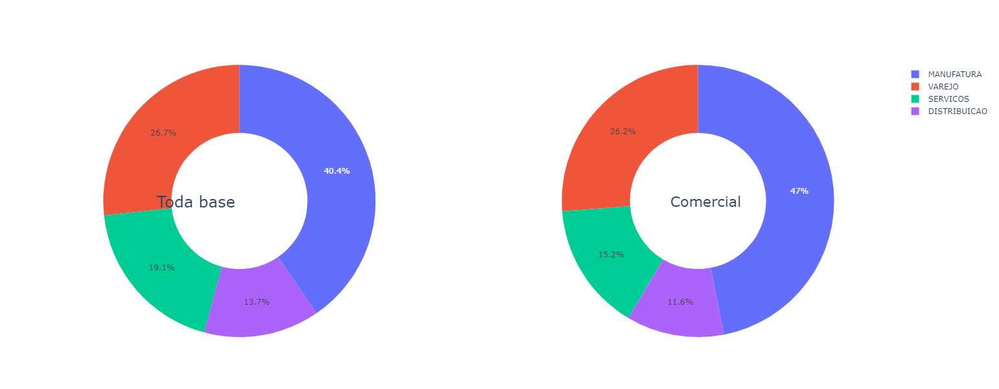

In [24]:
labels = df_zd_churn['ds_seg_cnta'].value_counts()[:4].index.tolist()

fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])

fig.add_trace(go.Pie(labels=labels, values=df_zd_churn['ds_seg_cnta'].value_counts()[:4], name="Toda base"),
              1, 1)
fig.add_trace(go.Pie(labels=labels, values=df_zd_churn_com['ds_seg_cnta'].value_counts()[:4], name="Comercial"),
              1, 2)

fig.update_traces(hole=.5)

fig.update_layout(
    title_text="", width=1000, height=600,
    annotations=[dict(text='Toda base', x=0.124, y=0.5, font_size=24, showarrow=False),
                 dict(text='Comercial', x=0.828, y=0.5, font_size=22, showarrow=False)])
fig.update_layout()
fig.show()

In [25]:
# a = df_nps.groupby('cod_cliente').agg({'avaliacao_unidade_responsavel': 'mean', 'nota': 'mean', 'tempo_resposta_total_seg_fe': 'sum'}).drop_duplicates()

# df_churn_zd = df_churn_zd.merge(a, left_on='cd_cnta', right_on=a.index, how='left')
# df_churn_zd = df_churn_zd.merge(df_nps[['cod_cliente','avaliacao_unidade_responsavel_fe','nota_fe']], left_on='cd_cnta', right_on='cod_cliente', how='left').drop_duplicates()

# df_churn_zd_com = df_churn_zd_com.merge(a, left_on='cd_cnta', right_on=a.index, how='left')
# df_churn_zd_com = df_churn_zd_com.merge(df_nps[['cod_cliente','avaliacao_unidade_responsavel_fe','nota_fe']], left_on='cd_cnta', right_on='cod_cliente', how='left').drop_duplicates()

In [26]:
df_churn_zd_com['ds_seg_cnta'].value_counts()

VAREJO                   185
MANUFATURA                75
DISTRIBUICAO              55
SERVICOS                  48
LOGISTICA                 27
SAUDE                     21
CONSTRUCAO E PROJETOS     21
EDUCACIONAL               15
HOSPITALITY               11
AGROINDUSTRIA             11
JURIDICO                   2
SUPERMERCADOS              1
Name: ds_seg_cnta, dtype: int64

## Hipoteses:
- Venda mal feita, cliente esta comprando produto X e esperando produto Y. - ver em produto e words em nps
- Ausencia de conhecimento do time executivo sobre o SW, isso causa muitos chamados e descontentamento - olhar zendesk tambem porque o cliente tem o executivo pra perguntar, se ta abrindo ticket é porque nao ta tendo atenção o suficiente ou o vendedor/executivo nao tem conhecimento suficiente 
- Erros de faturamento, falha no preenchimento da proposta - produto -> chamados abertos e nps (esssa é dificil)
- Venda de solução aderente (tempo que o cara fica / tempo de uso (talvez))
- Falta de retorno dos tickets e dificuldade de contato (olhar pra prod tambem (mas é o que já fiz)) mas olhar pra produto
  
  
  
- *Ações:*
- leitura de NPS por IA (já é o que fiz na wordcloud)
- Atuação mais rápida visando NPS e Tickets

	* Abordagens *
	- NPS, tickets, contratos
	- Agrupar por comercial (erro na venda, insatisfação com a venda, relacionamento comercial)
	- Rodar pesquisa com clientes para saber sobre a mudança de executivos


PSA pode ser recorrente ou pontual. se abrir muito chamado, pode ser que a equipe nao esta dando suporte/atenção

### Produto

In [27]:
df_zendesk.loc[df_zendesk['churn']==1]['nome_grupo_fe'].value_counts()

PRODUTO      1840597
CST           717060
CLOUD         391672
OUVIDORIA      26145
TI               804
CX                53
Name: nome_grupo_fe, dtype: int64

In [28]:
df_zendesk.loc[df_zendesk['churn']==1]['nome_grupo_fe'].value_counts(normalize=True)

PRODUTO      0.618411
CST          0.240921
CLOUD        0.131596
OUVIDORIA    0.008784
TI           0.000270
CX           0.000018
Name: nome_grupo_fe, dtype: float64

In [29]:
df_zendesk.loc[df_zendesk['churn']==0]['nome_grupo_fe'].value_counts()

PRODUTO      5910803
CST          2567198
CLOUD         717543
TI            282971
OUVIDORIA      55957
CX              5048
Name: nome_grupo_fe, dtype: int64

In [30]:
df_zendesk.loc[df_zendesk['churn']==0]['nome_grupo_fe'].value_counts(normalize=True)

PRODUTO      0.619612
CST          0.269112
CLOUD        0.075218
TI           0.029663
OUVIDORIA    0.005866
CX           0.000529
Name: nome_grupo_fe, dtype: float64

In [31]:
df_zendesk_mod['ano_criacao_fe'] = pd.to_datetime(df_zendesk_mod['data_criacao_fe']).dt.year
df_zendesk_mod_c['ano_criacao_fe'] = pd.to_datetime(df_zendesk_mod_c['data_criacao_fe']).dt.year
df_zendesk_mod_nc['ano_criacao_fe'] = pd.to_datetime(df_zendesk_mod_nc['data_criacao_fe']).dt.year
df_zendesk['ano_criacao_fe'] = pd.to_datetime(df_zendesk['data_criacao_fe']).dt.year
df_zd_churn_com['ano_criacao_fe'] = pd.to_datetime(df_zd_churn_com['data_criacao_fe']).dt.year

In [32]:
pd.crosstab(df_zendesk['ano_criacao_fe'], df_zendesk.loc[df_zendesk['churn']==1]['nome_grupo_fe'], margins=True)

nome_grupo_fe,CLOUD,CST,CX,OUVIDORIA,PRODUTO,TI,All
ano_criacao_fe,,,,,,,
2018,89290,156658,0,6182,359578,386,612094
2019,90470,205300,0,4799,421314,243,722126
2020,137545,248867,33,10363,700686,147,1097641
2021,74367,106235,20,4801,359019,28,544470
All,391672,717060,53,26145,1840597,804,2976331


In [33]:
pd.crosstab(df_zendesk['ano_criacao_fe'], df_zendesk.loc[df_zendesk['churn']==0]['nome_grupo_fe'], margins=True)

nome_grupo_fe,CLOUD,CST,CX,OUVIDORIA,PRODUTO,TI,All
ano_criacao_fe,,,,,,,
2018,134090,618027,0,15089,1115832,102215,1985253
2019,134586,608191,454,10335,1322131,95798,2171495
2020,252375,869740,2853,20483,2238849,83627,3467927
2021,196492,471240,1741,10050,1233991,1331,1914845
All,717543,2567198,5048,55957,5910803,282971,9539520


In [34]:
pd.crosstab(df_zendesk.loc[ (df_zendesk['ano_criacao_fe']>=2018) & (df_zendesk['ano_criacao_fe']<=2020) ]['ano_criacao_fe'], df_zendesk['nome_grupo_fe'], margins=True)

nome_grupo_fe,CLOUD,CST,CX,OUVIDORIA,PRODUTO,TI,All
ano_criacao_fe,,,,,,,
2018,223380,774685,0,21271,1475410,102601,2597347
2019,225056,813491,454,15134,1743445,96041,2893621
2020,389920,1118607,2886,30846,2939535,83774,4565568
All,838356,2706783,3340,67251,6158390,282416,10056536


In [35]:
perc_prod_c = pd.crosstab(df_zendesk['ano_criacao_fe'], df_zendesk.loc[df_zendesk['churn']==1]['nome_grupo_fe'])[:3]
perc_prod_nc = pd.crosstab(df_zendesk['ano_criacao_fe'], df_zendesk.loc[df_zendesk['churn']==0]['nome_grupo_fe'])[:3]

In [36]:
qttd_prod_total = []
for i in perc_prod_c.columns:
    qttd_prod_total.append(pd.crosstab(df_zendesk['ano_criacao_fe'].loc[ (df_zendesk['ano_criacao_fe']>=2018) & (df_zendesk['ano_criacao_fe']<=2020) ], df_zendesk['nome_grupo_fe'], margins=True).filter(like = 'All', axis=0)[i].tolist()[0])

In [37]:
perc_prod_nc['CLOUD'] / qttd_prod_total[0]

ano_criacao_fe
2018    0.159944
2019    0.160536
2020    0.301036
Name: CLOUD, dtype: float64

In [38]:
perc_prod_c['CLOUD'] / qttd_prod_total[0]

ano_criacao_fe
2018    0.106506
2019    0.107914
2020    0.164065
Name: CLOUD, dtype: float64

In [39]:
df_aux = ((perc_prod_c['CLOUD'] / qttd_prod_total[0]).to_frame()).merge(((perc_prod_c['CST'] / qttd_prod_total[1]).to_frame()),left_index=True, right_index=True, how='left')
df_aux = df_aux.merge(((perc_prod_c['CX'] / qttd_prod_total[2]).to_frame()),left_index=True, right_index=True, how='left')
df_aux = df_aux.merge(((perc_prod_c['OUVIDORIA'] / qttd_prod_total[3]).to_frame()),left_index=True, right_index=True, how='left')
df_aux = df_aux.merge(((perc_prod_c['PRODUTO'] / qttd_prod_total[4]).to_frame()),left_index=True, right_index=True, how='left')
df_aux = df_aux.merge(((perc_prod_c['TI'] / qttd_prod_total[5]).to_frame()),left_index=True, right_index=True, how='left')

df_aux_nc = ((perc_prod_nc['CLOUD'] / qttd_prod_total[0]).to_frame()).merge(((perc_prod_nc['CST'] / qttd_prod_total[1]).to_frame()),left_index=True, right_index=True, how='left')
df_aux_nc = df_aux_nc.merge(((perc_prod_nc['CX'] / qttd_prod_total[2]).to_frame()),left_index=True, right_index=True, how='left')
df_aux_nc = df_aux_nc.merge(((perc_prod_nc['OUVIDORIA'] / qttd_prod_total[3]).to_frame()),left_index=True, right_index=True, how='left')
df_aux_nc = df_aux_nc.merge(((perc_prod_nc['PRODUTO'] / qttd_prod_total[4]).to_frame()),left_index=True, right_index=True, how='left')
df_aux_nc = df_aux_nc.merge(((perc_prod_nc['TI'] / qttd_prod_total[5]).to_frame()),left_index=True, right_index=True, how='left')

In [40]:
df_aux

,CLOUD,CST,CX,OUVIDORIA,PRODUTO,TI
ano_criacao_fe,,,,,,
2018,0.106506,0.057876,0.00000,0.091924,0.058388,0.001367
2019,0.107914,0.075846,0.00000,0.071360,0.068413,0.000860
2020,0.164065,0.091942,0.00988,0.154094,0.113777,0.000521


In [41]:
perc_prod_c.columns.tolist()

['CLOUD', 'CST', 'CX', 'OUVIDORIA', 'PRODUTO', 'TI']

In [42]:
df_aux.filter(like = '2018', axis=0).values.tolist()[0]

[0.10650606663517646,
 0.05787608389737929,
 0.0,
 0.09192428365377467,
 0.05838831252973586,
 0.0013667780862274092]

In [43]:
df_aux.columns.tolist()

['CLOUD', 'CST', 'CX', 'OUVIDORIA', 'PRODUTO', 'TI']

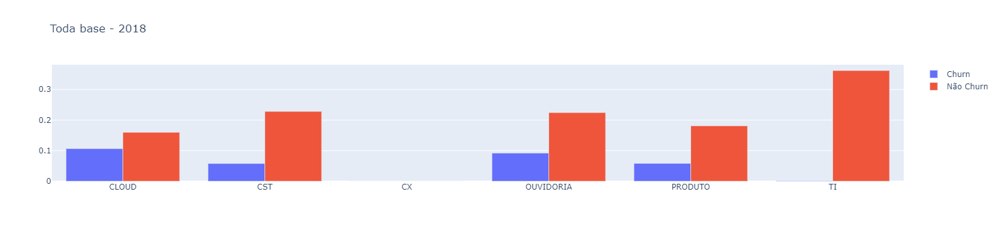

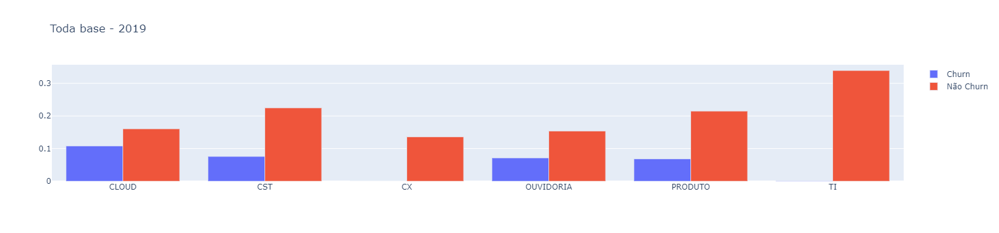

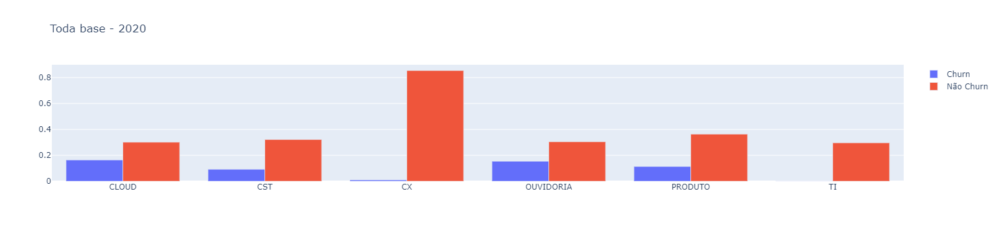

In [44]:
x = df_aux.columns.tolist()
y1 = df_aux.filter(like = '2018', axis=0).values.tolist()[0]
y2 = df_aux_nc.filter(like = '2018', axis=0).values.tolist()[0]

fig = go.Figure(data=[
    go.Bar(name='Churn', x=x, y=y1),
    go.Bar(name='Não Churn', x=x, y=y2)
])

fig.update_layout(barmode='group', width=700, height=350, title_text='Toda base - 2018')
fig.show()

x = df_aux.columns.tolist()
y1 = df_aux.filter(like = '2019', axis=0).values.tolist()[0]
y2 = df_aux_nc.filter(like = '2019', axis=0).values.tolist()[0]

fig = go.Figure(data=[
    go.Bar(name='Churn', x=x, y=y1),
    go.Bar(name='Não Churn', x=x, y=y2)
])

fig.update_layout(barmode='group', width=700, height=350, title_text='Toda base - 2019')
fig.show()


x = df_aux.columns.tolist()
y1 = df_aux.filter(like = '2020', axis=0).values.tolist()[0]
y2 = df_aux_nc.filter(like = '2020', axis=0).values.tolist()[0]

fig = go.Figure(data=[
    go.Bar(name='Churn', x=x, y=y1),
    go.Bar(name='Não Churn', x=x, y=y2)
])

fig.update_layout(barmode='group', width=700, height=350, title_text='Toda base - 2020')
fig.show()

In [45]:
print(pd.crosstab(df_zendesk.loc[df_zendesk['churn']==1]['ano_criacao_fe'], df_zendesk.loc[df_zendesk['churn']==1]['nome_grupo_fe'], margins=True)['CLOUD'][:3] / pd.crosstab(df_zendesk['ano_criacao_fe'], df_zendesk['nome_grupo_fe'], margins=True)['CLOUD'][:3])
print()
print(pd.crosstab(df_zendesk.loc[df_zendesk['churn']==0]['ano_criacao_fe'], df_zendesk.loc[df_zendesk['churn']==0]['nome_grupo_fe'], margins=True)['CLOUD'][:3] / pd.crosstab(df_zendesk['ano_criacao_fe'], df_zendesk['nome_grupo_fe'], margins=True)['CLOUD'][:3])

ano_criacao_fe
2018    0.399722
2019    0.401989
2020    0.352752
Name: CLOUD, dtype: float64

ano_criacao_fe
2018    0.600278
2019    0.598011
2020    0.647248
Name: CLOUD, dtype: float64


In [46]:
print(pd.crosstab(df_zendesk.loc[df_zendesk['churn']==1]['ano_criacao_fe'], df_zendesk.loc[df_zendesk['churn']==1]['nome_grupo_fe'], margins=True)['CST'][:3] / pd.crosstab(df_zendesk['ano_criacao_fe'], df_zendesk['nome_grupo_fe'], margins=True)['CST'][:3])
print()
print(pd.crosstab(df_zendesk.loc[df_zendesk['churn']==0]['ano_criacao_fe'], df_zendesk.loc[df_zendesk['churn']==0]['nome_grupo_fe'], margins=True)['CST'][:3] / pd.crosstab(df_zendesk['ano_criacao_fe'], df_zendesk['nome_grupo_fe'], margins=True)['CST'][:3])

ano_criacao_fe
2018    0.202222
2019    0.252369
2020    0.222479
Name: CST, dtype: float64

ano_criacao_fe
2018    0.797778
2019    0.747631
2020    0.777521
Name: CST, dtype: float64


**OUVIDORIA**

In [47]:
print(pd.crosstab(df_zendesk.loc[df_zendesk['churn']==1]['ano_criacao_fe'], df_zendesk.loc[df_zendesk['churn']==1]['nome_grupo_fe'], margins=True)['OUVIDORIA'][:3] / pd.crosstab(df_zendesk['ano_criacao_fe'], df_zendesk['nome_grupo_fe'], margins=True)['OUVIDORIA'][:3])
print()
print(pd.crosstab(df_zendesk.loc[df_zendesk['churn']==0]['ano_criacao_fe'], df_zendesk.loc[df_zendesk['churn']==0]['nome_grupo_fe'], margins=True)['OUVIDORIA'][:3] / pd.crosstab(df_zendesk['ano_criacao_fe'], df_zendesk['nome_grupo_fe'], margins=True)['OUVIDORIA'][:3])

ano_criacao_fe
2018    0.290630
2019    0.317101
2020    0.335959
Name: OUVIDORIA, dtype: float64

ano_criacao_fe
2018    0.709370
2019    0.682899
2020    0.664041
Name: OUVIDORIA, dtype: float64


In [48]:
pd.crosstab(df_zendesk.loc[df_zendesk['churn']==1]['ano_criacao_fe'], df_zendesk.loc[df_zendesk['churn']==1]['nome_grupo_fe'], margins=True)['OUVIDORIA'][:3] / pd.crosstab(df_zendesk.loc[df_zendesk['churn']==0]['ano_criacao_fe'], df_zendesk.loc[df_zendesk['churn']==0]['nome_grupo_fe'], margins=True)['OUVIDORIA'][:3]

ano_criacao_fe
2018    0.409702
2019    0.464344
2020    0.505932
Name: OUVIDORIA, dtype: float64

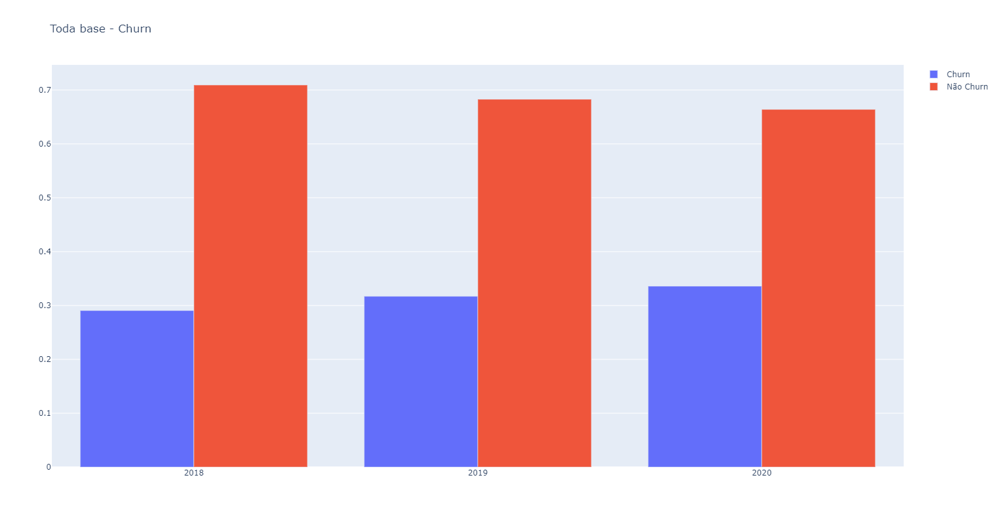

In [49]:
x = pd.crosstab(df_zendesk.loc[df_zendesk['churn']==1]['ano_criacao_fe'], df_zendesk.loc[df_zendesk['churn']==1]['nome_grupo_fe'], margins=True)['OUVIDORIA'][:3].sort_index().index.astype(str)
y1 = pd.crosstab(df_zendesk.loc[df_zendesk['churn']==1]['ano_criacao_fe'], df_zendesk.loc[df_zendesk['churn']==1]['nome_grupo_fe'], margins=True)['OUVIDORIA'][:3] / pd.crosstab(df_zendesk['ano_criacao_fe'], df_zendesk['nome_grupo_fe'], margins=True)['OUVIDORIA'][:3].sort_index()
y2 = pd.crosstab(df_zendesk.loc[df_zendesk['churn']==0]['ano_criacao_fe'], df_zendesk.loc[df_zendesk['churn']==0]['nome_grupo_fe'], margins=True)['OUVIDORIA'][:3] / pd.crosstab(df_zendesk['ano_criacao_fe'], df_zendesk['nome_grupo_fe'], margins=True)['OUVIDORIA'][:3].sort_index()

fig = go.Figure(data=[
    go.Bar(name='Churn', x=x, y=y1),
    go.Bar(name='Não Churn', x=x, y=y2)
])

fig.update_layout(barmode='group', width=700, height=800, title_text='Toda base - Churn')
fig.show()

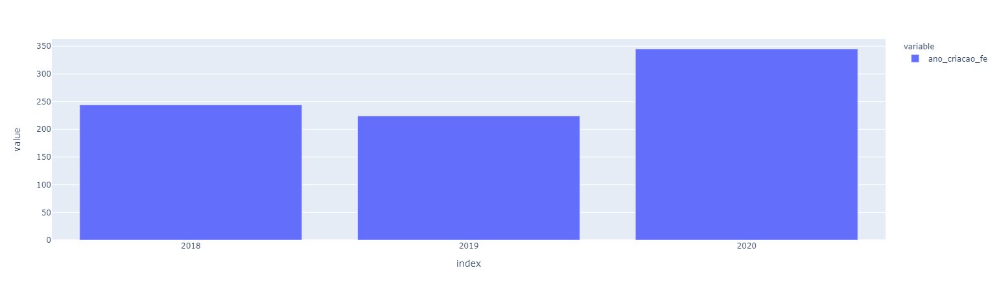

In [50]:
df_zd_churn_com.loc[ (df_zd_churn_com['ano_criacao_fe']<2021) & (df_zd_churn_com['nome_grupo_fe']=='OUVIDORIA') ]['ano_criacao_fe'].astype(str).value_counts().sort_index().plot.bar()

In [51]:
# x = pd.crosstab(df_zd_churn_com.loc[df_zendesk['churn']==1]['ano_criacao_fe'], df_zendesk.loc[df_zendesk['churn']==1]['nome_grupo_fe'], margins=True)['OUVIDORIA'][:3].sort_index().index.astype(str)
# y1 = pd.crosstab(df_zendesk.loc[df_zendesk['churn']==1]['ano_criacao_fe'], df_zendesk.loc[df_zendesk['churn']==1]['nome_grupo_fe'], margins=True)['OUVIDORIA'][:3] / pd.crosstab(df_zendesk['ano_criacao_fe'], df_zendesk['nome_grupo_fe'], margins=True)['OUVIDORIA'][:3].sort_index()
# y2 = pd.crosstab(df_zendesk.loc[df_zendesk['churn']==0]['ano_criacao_fe'], df_zendesk.loc[df_zendesk['churn']==0]['nome_grupo_fe'], margins=True)['OUVIDORIA'][:3] / pd.crosstab(df_zendesk['ano_criacao_fe'], df_zendesk['nome_grupo_fe'], margins=True)['OUVIDORIA'][:3].sort_index()

# fig = go.Figure(data=[
#     go.Bar(name='Churn', x=x, y=y1),
#     go.Bar(name='Não Churn', x=x, y=y2)
# ])

# fig.update_layout(barmode='group', width=700, height=800, title_text='Toda base - Churn')
# fig.show()

In [52]:
df_coments = pd.DataFrame(df_zd_churn_com.loc[ (df_zd_churn_com['ds_seg_cnta']=='DISTRIBUICAO') & (df_zd_churn_com['status_ticket']=='PENDING') ][['titulo_ticket']])
df_coments['titulo_ticket'] = [Limpeza_coments(i) for i in df_coments['titulo_ticket']]
df_coments.drop(df_coments.loc[df_coments['titulo_ticket']=='sem dado'].index, axis=0, inplace=True)
df_coments['titulo_ticket'] = df_coments['titulo_ticket'].str.replace('_','')

df_coments.shape

(14, 1)

In [53]:
print(pd.crosstab(df_zendesk.loc[df_zendesk['churn']==1]['ano_criacao_fe'], df_zendesk.loc[df_zendesk['churn']==1]['nome_grupo_fe'], margins=True)['PRODUTO'][:3] / pd.crosstab(df_zendesk['ano_criacao_fe'], df_zendesk['nome_grupo_fe'], margins=True)['PRODUTO'][:3])
print()
print(pd.crosstab(df_zendesk.loc[df_zendesk['churn']==0]['ano_criacao_fe'], df_zendesk.loc[df_zendesk['churn']==0]['nome_grupo_fe'], margins=True)['PRODUTO'][:3] / pd.crosstab(df_zendesk['ano_criacao_fe'], df_zendesk['nome_grupo_fe'], margins=True)['PRODUTO'][:3])

ano_criacao_fe
2018    0.243714
2019    0.241656
2020    0.238366
Name: PRODUTO, dtype: float64

ano_criacao_fe
2018    0.756286
2019    0.758344
2020    0.761634
Name: PRODUTO, dtype: float64


In [54]:
print(pd.crosstab(df_zendesk.loc[df_zendesk['churn']==1]['ano_criacao_fe'], df_zendesk.loc[df_zendesk['churn']==1]['nome_grupo_fe'], margins=True)['TI'][:3] / pd.crosstab(df_zendesk['ano_criacao_fe'], df_zendesk['nome_grupo_fe'], margins=True)['TI'][:3])
print()
print(pd.crosstab(df_zendesk.loc[df_zendesk['churn']==0]['ano_criacao_fe'], df_zendesk.loc[df_zendesk['churn']==0]['nome_grupo_fe'], margins=True)['TI'][:3] / pd.crosstab(df_zendesk['ano_criacao_fe'], df_zendesk['nome_grupo_fe'], margins=True)['TI'][:3])

ano_criacao_fe
2018    0.003762
2019    0.002530
2020    0.001755
Name: TI, dtype: float64

ano_criacao_fe
2018    0.996238
2019    0.997470
2020    0.998245
Name: TI, dtype: float64


In [55]:
df_zendesk.loc[ (df_zendesk['churn']==1) & (df_zendesk['data_criacao_fe']>='2018-01') & (df_zendesk['data_criacao_fe']<='2018-12') ]['nome_grupo_fe'].value_counts()#['nome_grupo_fe'].value_counts()

PRODUTO      359578
CST          156658
CLOUD         89290
OUVIDORIA      6182
TI              386
Name: nome_grupo_fe, dtype: int64

In [56]:
df_zendesk.loc[ (df_zendesk['churn']==0) & (df_zendesk['data_criacao_fe']>='2018-01') & (df_zendesk['data_criacao_fe']<='2018-12') ]['nome_grupo_fe'].value_counts()#['nome_grupo_fe'].value_counts()

PRODUTO      1115832
CST           618027
CLOUD         134090
TI            102215
OUVIDORIA      15089
Name: nome_grupo_fe, dtype: int64

In [57]:
df_zendesk.loc[ (df_zendesk['data_criacao_fe']>='2018-01') & (df_zendesk['data_criacao_fe']<='2018-12') ]['nome_grupo_fe'].value_counts()#['nome_grupo_fe'].value_counts()

PRODUTO      1475410
CST           774685
CLOUD         223380
TI            102601
OUVIDORIA      21271
Name: nome_grupo_fe, dtype: int64

In [58]:
df_zendesk_mod_c.groupby('ano_criacao_fe').sum()[:1]#[['cloud','cst','cx','ouvidoria','produto','ti']].sum(axis=0).sort_index()

,cloud,cst,cx,ouvidoria,produto,ti,incident,problem,question,sem_dado_tipo_ticket,task,high,low,normal,sem_dado_priori_ticket,urgent,closed,deleted,hold,new,open,pending,sem_dado_status_ticket,solved
ano_criacao_fe,,,,,,,,,,,,,,,,,,,,,,,,
2018,89290,156658,0,6182,359578,386,17177,19698,539446,7290,28483,108920,206144,212245,2327,82458,609068,241,1270,0,8,48,1438,21


trazer em uma visao de media por periodo

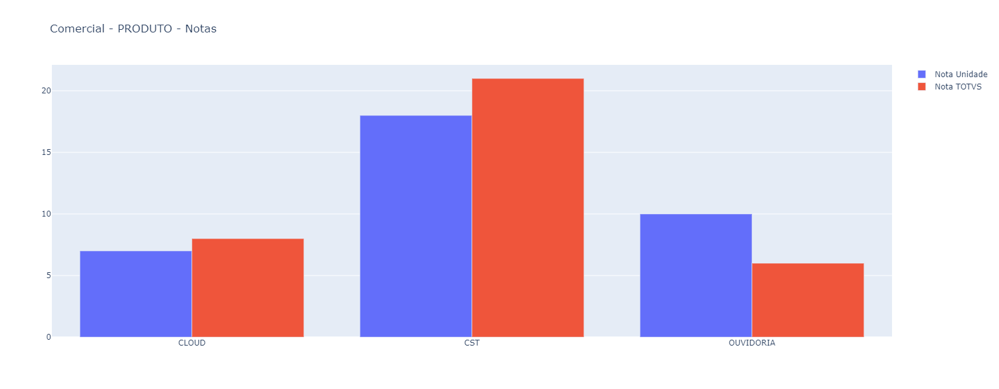

In [59]:
x = df_zendesk.loc[ (df_zendesk['churn']==1) & (df_zendesk['data_criacao_fe']>='2018-01') & (df_zendesk['data_criacao_fe']<='2018-12') ]['nome_grupo_fe'].value_counts().sort_index().index

fig = go.Figure(data=[
    go.Bar(name='Nota Unidade', x=x, y=df_zd_churn_com.loc[df_zd_churn_com['nome_grupo_fe']=='PRODUTO'].dropna().drop_duplicates(subset=['codigo_organizacao'])['grupo_av_un_fe'].value_counts().sort_index()),
    go.Bar(name='Nota TOTVS', x=x, y=df_zd_churn_com.loc[df_zd_churn_com['nome_grupo_fe']=='PRODUTO'].dropna().drop_duplicates(subset=['codigo_organizacao'])['grupo_nota_fe'].value_counts().sort_index())
])

fig.update_layout(barmode='group', width=700, height=600, title_text='Comercial - PRODUTO - Notas')
fig.show()

In [60]:
df_zendesk.loc[ (df_zendesk['churn']==1) & (df_zendesk['nome_grupo_fe']=='CLOUD') ]['data_criacao_fe'].value_counts().sort_index()

2018-01     7740
2018-02     7665
2018-03     8580
2018-04     7474
2018-05     7494
2018-06     8219
2018-07     8187
2018-08     8697
2018-09     6252
2018-10     7105
2018-11     6186
2018-12     5691
2019-01     7406
2019-02     8237
2019-03     6689
2019-04     7084
2019-05     8403
2019-06     6277
2019-07     7299
2019-08     7266
2019-09     7804
2019-10     9104
2019-11     8361
2019-12     6540
2020-01     7803
2020-02     7190
2020-03     7564
2020-04     5978
2020-05    11678
2020-06    13820
2020-07    12749
2020-08    13834
2020-09    14792
2020-10    14163
2020-11    13649
2020-12    14325
2021-01    12621
2021-02    14316
2021-03    16158
2021-04    14704
2021-05    14414
2021-06     2154
Name: data_criacao_fe, dtype: int64

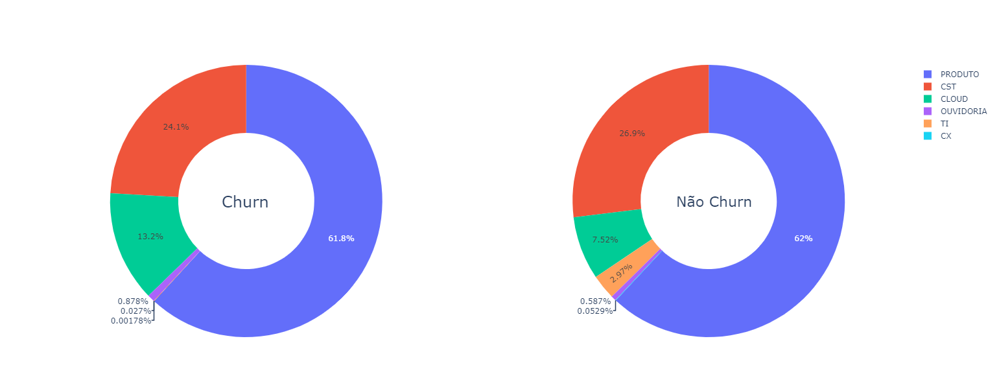

In [61]:
labels = df_zendesk['nome_grupo_fe'].value_counts().sort_index().index.tolist()

fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])

fig.add_trace(go.Pie(labels=labels, values=df_zendesk.loc[df_zendesk['churn']==1]['nome_grupo_fe'].value_counts().sort_index(), name="Churn"),
              1, 1)
fig.add_trace(go.Pie(labels=labels, values=df_zendesk.loc[df_zendesk['churn']==0]['nome_grupo_fe'].value_counts().sort_index(), name="Não Churn"),
              1, 2)

fig.update_traces(hole=.5)

fig.update_layout(
    title_text="", width=1000, height=600,
    annotations=[dict(text='Churn', x=0.194, y=0.5, font_size=24, showarrow=False),
                 dict(text='Não Churn', x=0.828, y=0.5, font_size=22, showarrow=False)])
fig.update_layout()
fig.show()

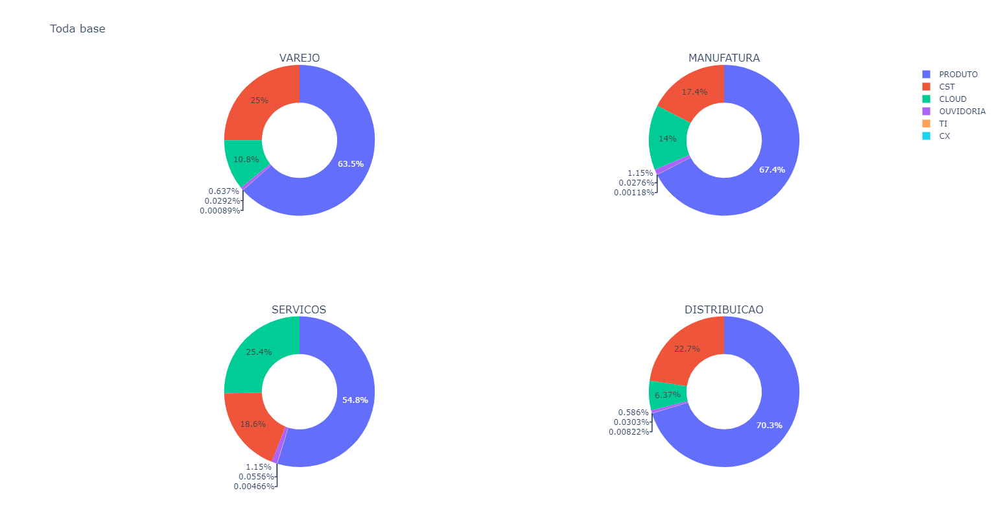

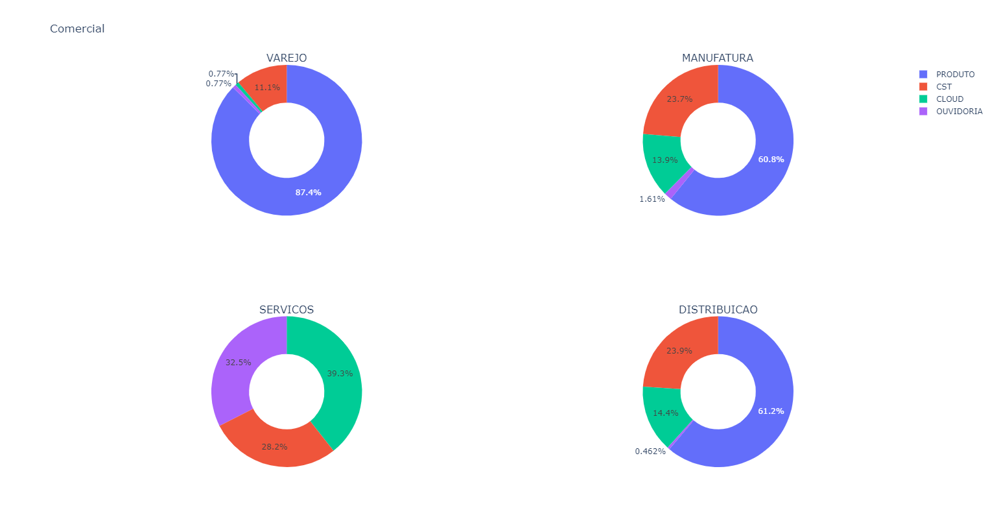

In [62]:
values = ['VAREJO', 'MANUFATURA', 'SERVICOS', 'DISTRIBUICAO']
labels = df_zd_churn.dropna().loc[df_zd_churn['ds_seg_cnta']==values[0]]['nome_grupo_fe'].value_counts().sort_index().index.tolist()

fig = make_subplots(rows=2, cols=2, subplot_titles=(values[0],values[1],values[2],values[3]),
                    specs=[[{"type": "domain"}, {"type": "domain"}],
                           [{"type": "domain"}, {"type": "domain"}]
                           ])

fig.add_trace(go.Pie(labels=labels, values=df_zd_churn.dropna().loc[df_zd_churn['ds_seg_cnta']==values[0]]['nome_grupo_fe'].value_counts().sort_index(), name=values[0]),
              row=1, col=1)
fig.add_trace(go.Pie(labels=labels, values=df_zd_churn.dropna().loc[df_zd_churn['ds_seg_cnta']==values[1]]['nome_grupo_fe'].value_counts().sort_index(), name=values[1]),
              row=1, col=2)
fig.add_trace(go.Pie(labels=labels, values=df_zd_churn.dropna().loc[df_zd_churn['ds_seg_cnta']==values[2]]['nome_grupo_fe'].value_counts().sort_index(), name=values[2]),
              row=2, col=1)
fig.add_trace(go.Pie(labels=labels, values=df_zd_churn.dropna().loc[df_zd_churn['ds_seg_cnta']==values[3]]['nome_grupo_fe'].value_counts().sort_index(), name=values[3]),
              row=2, col=2)


fig.update_traces(hole=.5)

fig.update_layout(
    title_text="Toda base",)
fig.update_layout(width=1000, height=800)
fig.show()

# -----------------------------------------------------------------------------------------------------------------------------------------------------------------

labels = df_zd_churn_com.dropna().loc[df_zd_churn_com['ds_seg_cnta']==values[0]]['nome_grupo_fe'].value_counts().sort_index().index.tolist()

fig = make_subplots(rows=2, cols=2, subplot_titles=(values[0],values[1],values[2],values[3]),
                    specs=[[{"type": "domain"}, {"type": "domain"}],
                           [{"type": "domain"}, {"type": "domain"}]
                           ])

fig.add_trace(go.Pie(labels=labels, values=df_zd_churn_com.dropna().loc[df_zd_churn_com['ds_seg_cnta']==values[0]]['nome_grupo_fe'].value_counts().sort_index(), name=values[0]),
              row=1, col=1)
fig.add_trace(go.Pie(labels=labels, values=df_zd_churn_com.dropna().loc[df_zd_churn_com['ds_seg_cnta']==values[1]]['nome_grupo_fe'].value_counts().sort_index(), name=values[1]),
              row=1, col=2)
fig.add_trace(go.Pie(labels=labels, values=df_zd_churn_com.dropna().loc[df_zd_churn_com['ds_seg_cnta']==values[2]]['nome_grupo_fe'].value_counts().sort_index(), name=values[2]),
              row=2, col=1)
fig.add_trace(go.Pie(labels=labels, values=df_zd_churn_com.dropna().loc[df_zd_churn_com['ds_seg_cnta']==values[3]]['nome_grupo_fe'].value_counts().sort_index(), name=values[3]),
              row=2, col=2)


fig.update_traces(hole=.5)

fig.update_layout(
    title_text="Comercial",)
fig.update_layout(width=1000, height=800)
fig.show()

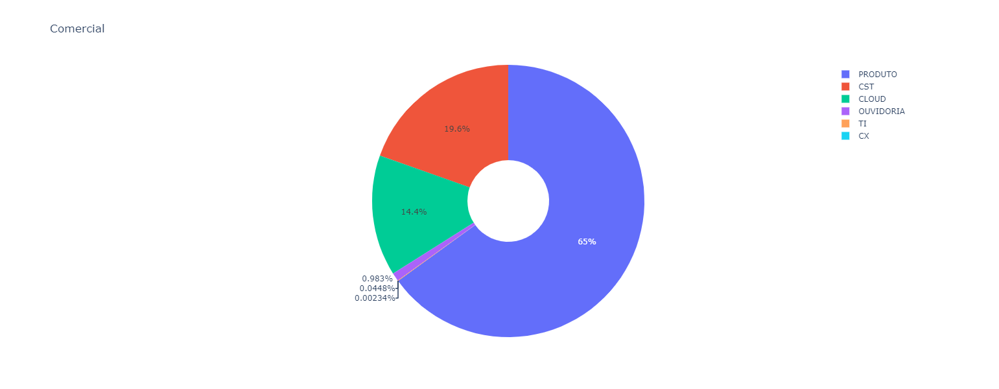

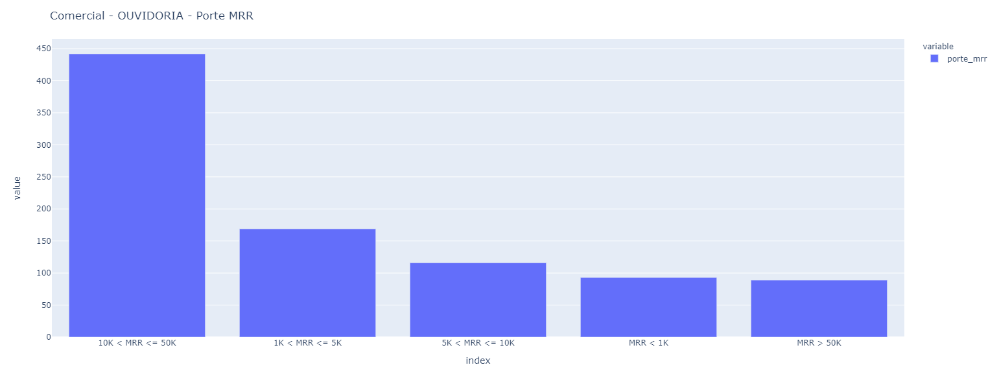

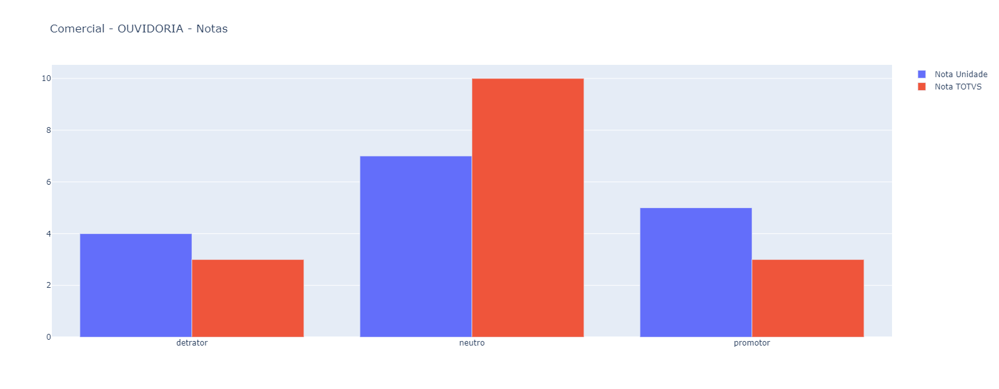

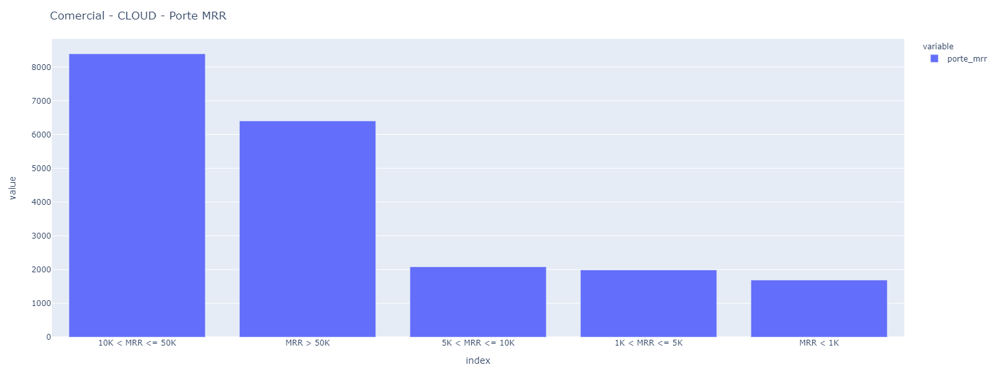

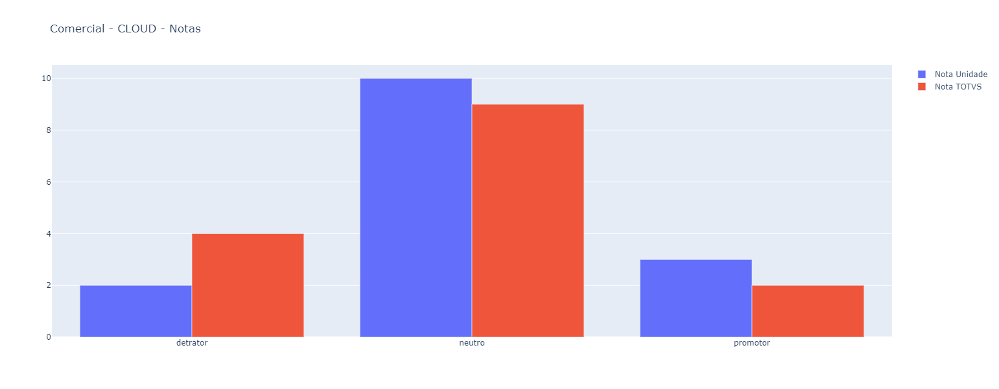

In [63]:
labels = df_zd_churn['nome_grupo_fe'].value_counts().index.tolist()

fig = go.Figure(data=[go.Pie(labels=labels, values=df_zd_churn['nome_grupo_fe'].value_counts(), hole=.3)])
fig.update_layout(width=700, height=600, title_text='Comercial')
fig.show()

# ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------

fig = df_zd_churn_com.loc[df_zd_churn_com['nome_grupo_fe']=='OUVIDORIA']['porte_mrr'].value_counts().plot.bar()
fig.update_layout(width=700, height=600, title_text='Comercial - OUVIDORIA - Porte MRR')
fig.show()

# ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------

x = df_zd_churn_com.loc[df_zd_churn_com['nome_grupo_fe']=='OUVIDORIA'].dropna().drop_duplicates(subset=['codigo_organizacao'])['grupo_av_un_fe'].value_counts().sort_index().index
fig = go.Figure(data=[
    go.Bar(name='Nota Unidade', x=x, y=df_zd_churn_com.loc[df_zd_churn_com['nome_grupo_fe']=='OUVIDORIA'].dropna().drop_duplicates(subset=['codigo_organizacao'])['grupo_av_un_fe'].value_counts().sort_index()),
    go.Bar(name='Nota TOTVS', x=x, y=df_zd_churn_com.loc[df_zd_churn_com['nome_grupo_fe']=='OUVIDORIA'].dropna().drop_duplicates(subset=['codigo_organizacao'])['grupo_nota_fe'].value_counts().sort_index())
])

fig.update_layout(barmode='group', width=700, height=600, title_text='Comercial - OUVIDORIA - Notas')
fig.show()

# ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------

fig = df_zd_churn_com.loc[df_zd_churn_com['nome_grupo_fe']=='CLOUD']['porte_mrr'].value_counts().plot.bar()
fig.update_layout(width=700, height=600, title_text='Comercial - CLOUD - Porte MRR')
fig.show()

# ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------

x = df_zd_churn_com.loc[df_zd_churn_com['nome_grupo_fe']=='CLOUD'].dropna().drop_duplicates(subset=['codigo_organizacao'])['grupo_av_un_fe'].value_counts().sort_index().index
fig = go.Figure(data=[
    go.Bar(name='Nota Unidade', x=x, y=df_zd_churn_com.loc[df_zd_churn_com['nome_grupo_fe']=='CLOUD'].dropna().drop_duplicates(subset=['codigo_organizacao'])['grupo_av_un_fe'].value_counts().sort_index()),
    go.Bar(name='Nota TOTVS', x=x, y=df_zd_churn_com.loc[df_zd_churn_com['nome_grupo_fe']=='CLOUD'].dropna().drop_duplicates(subset=['codigo_organizacao'])['grupo_nota_fe'].value_counts().sort_index())
])

fig.update_layout(barmode='group', width=700, height=600, title_text='Comercial - CLOUD - Notas')
fig.show()

### Prioridade Ticket

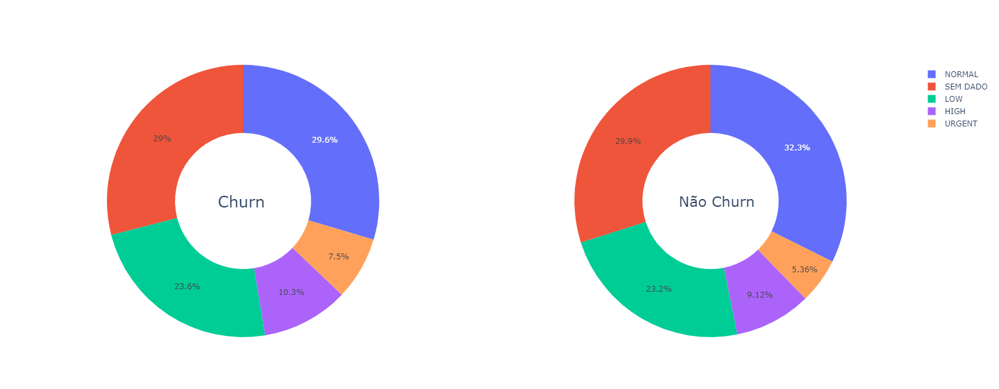

In [64]:
labels = df_zendesk['prioridade_ticket'].value_counts().index.tolist()

fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])

fig.add_trace(go.Pie(labels=labels, values=df_zendesk.loc[df_zendesk['churn']==1]['prioridade_ticket'].value_counts(), name="Churn"),
              1, 1)
fig.add_trace(go.Pie(labels=labels, values=df_zendesk.loc[df_zendesk['churn']==0]['prioridade_ticket'].value_counts(), name="Não Churn"),
              1, 2)

fig.update_traces(hole=.5)

fig.update_layout(
    title_text="", width=1000, height=600,
    annotations=[dict(text='Churn', x=0.194, y=0.5, font_size=24, showarrow=False),
                 dict(text='Não Churn', x=0.828, y=0.5, font_size=22, showarrow=False)])
fig.update_layout()
fig.show()

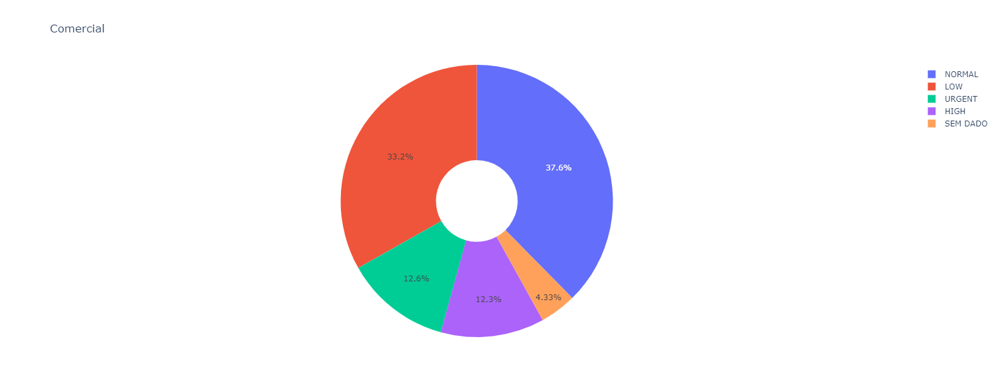

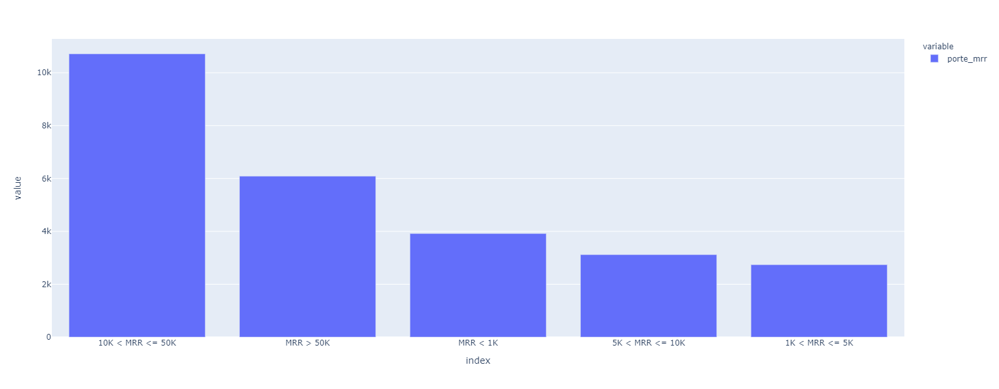

In [65]:
labels = df_zd_churn['prioridade_ticket'].value_counts().index.tolist()

fig = go.Figure(data=[go.Pie(labels=labels, values=df_zd_churn['prioridade_ticket'].value_counts(), hole=.3)])
fig.update_layout(width=700, height=600, title_text='Comercial')
fig.show()

fig = df_zd_churn_com.loc[ (df_zd_churn_com['prioridade_ticket']=='URGENT') | (df_zd_churn_com['prioridade_ticket']=='HIGH') ]['porte_mrr'].value_counts().plot.bar()
fig.update_layout(width=700, height=600)
fig.show()

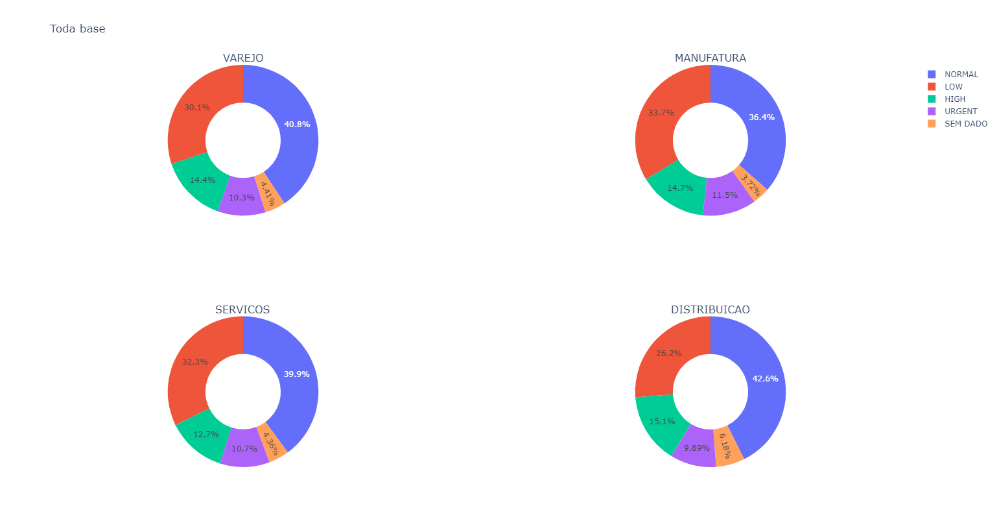

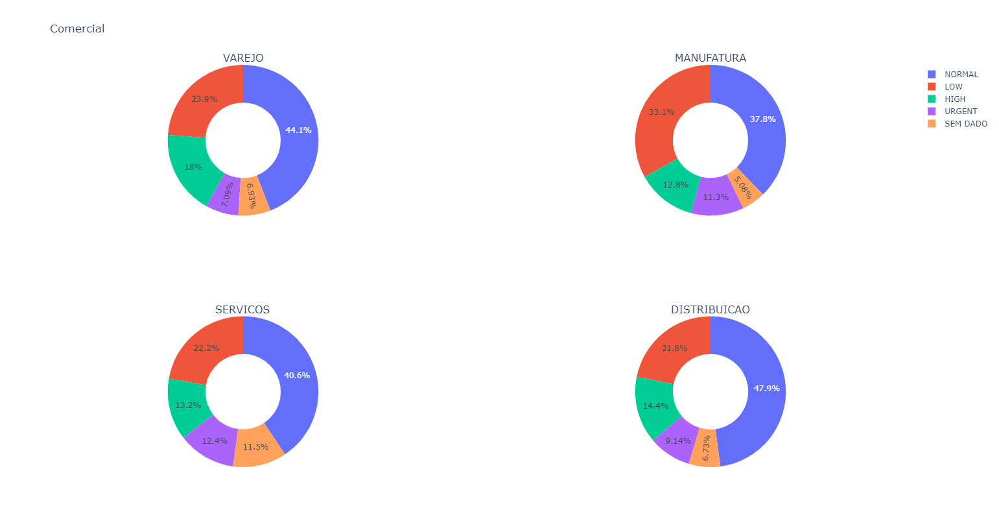

In [66]:
# ls_grupos = ['cloud','cst','cx','ouvidoria','produto','ti']
# ls_priori = ['high','low','normal','sem_dado_priori_ticket','urgent']
# ls_tp_tkt = ['incident','problem','question','sem_dado_tipo_ticket','task']
# ls_status_tkt = ['urgent','closed','deleted','hold','new','open','pending','sem_dado_status_ticket','solved']

labels = df_zd_churn.dropna().loc[df_zd_churn['ds_seg_cnta']==values[0]]['prioridade_ticket'].value_counts().index.tolist()
values = ['VAREJO', 'MANUFATURA', 'SERVICOS', 'DISTRIBUICAO']

fig = make_subplots(rows=2, cols=2, subplot_titles=(values[0],values[1],values[2],values[3]),
                    specs=[[{"type": "domain"}, {"type": "domain"}],
                           [{"type": "domain"}, {"type": "domain"}]
                           ])

fig.add_trace(go.Pie(labels=labels, values=df_zd_churn.dropna().loc[df_zd_churn['ds_seg_cnta']==values[0]]['prioridade_ticket'].value_counts(), name=values[0]),
              row=1, col=1)
fig.add_trace(go.Pie(labels=labels, values=df_zd_churn.dropna().loc[df_zd_churn['ds_seg_cnta']==values[1]]['prioridade_ticket'].value_counts(), name=values[1]),
              row=1, col=2)
fig.add_trace(go.Pie(labels=labels, values=df_zd_churn.dropna().loc[df_zd_churn['ds_seg_cnta']==values[2]]['prioridade_ticket'].value_counts(), name=values[2]),
              row=2, col=1)
fig.add_trace(go.Pie(labels=labels, values=df_zd_churn.dropna().loc[df_zd_churn['ds_seg_cnta']==values[3]]['prioridade_ticket'].value_counts(), name=values[3]),
              row=2, col=2)


fig.update_traces(hole=.5)

fig.update_layout(
    title_text="Toda base",)
fig.update_layout(width=1000, height=800)
fig.show()

# -----------------------------------------------------------------------------------------------------------------------------------------------------------------

fig = make_subplots(rows=2, cols=2, subplot_titles=(values[0],values[1],values[2],values[3]),
                    specs=[[{"type": "domain"}, {"type": "domain"}],
                           [{"type": "domain"}, {"type": "domain"}]
                           ])

fig.add_trace(go.Pie(labels=labels, values=df_zd_churn_com.dropna().loc[df_zd_churn_com['ds_seg_cnta']==values[0]]['prioridade_ticket'].value_counts(), name=values[0]),
              row=1, col=1)
fig.add_trace(go.Pie(labels=labels, values=df_zd_churn_com.dropna().loc[df_zd_churn_com['ds_seg_cnta']==values[1]]['prioridade_ticket'].value_counts(), name=values[1]),
              row=1, col=2)
fig.add_trace(go.Pie(labels=labels, values=df_zd_churn_com.dropna().loc[df_zd_churn_com['ds_seg_cnta']==values[2]]['prioridade_ticket'].value_counts(), name=values[2]),
              row=2, col=1)
fig.add_trace(go.Pie(labels=labels, values=df_zd_churn_com.dropna().loc[df_zd_churn_com['ds_seg_cnta']==values[3]]['prioridade_ticket'].value_counts(), name=values[3]),
              row=2, col=2)


fig.update_traces(hole=.5)

fig.update_layout(
    title_text="Comercial",)
fig.update_layout(width=1000, height=800)
fig.show()

### Status do ticket

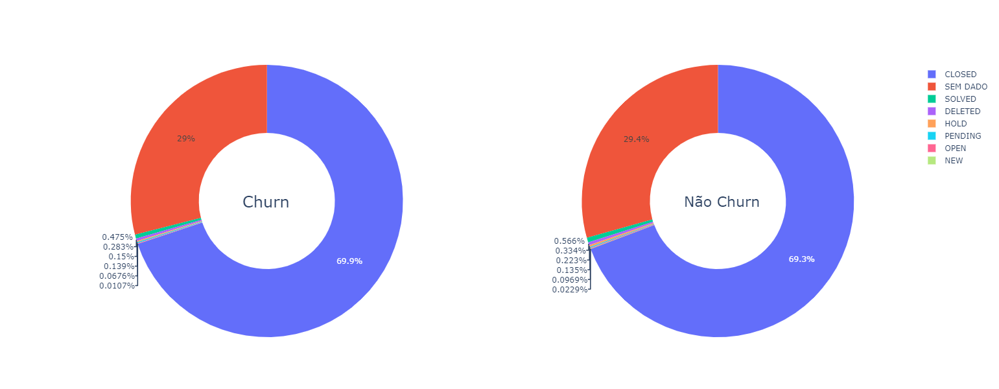

In [67]:
labels = df_zendesk['status_ticket'].value_counts().index.tolist()

fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])

fig.add_trace(go.Pie(labels=labels, values=df_zendesk.loc[df_zendesk['churn']==1]['status_ticket'].value_counts(), name="Churn"),
              1, 1)
fig.add_trace(go.Pie(labels=labels, values=df_zendesk.loc[df_zendesk['churn']==0]['status_ticket'].value_counts(), name="Não Churn"),
              1, 2)

fig.update_traces(hole=.5)

fig.update_layout(
    title_text="", width=1000, height=600,
    annotations=[dict(text='Churn', x=0.194, y=0.5, font_size=24, showarrow=False),
                 dict(text='Não Churn', x=0.828, y=0.5, font_size=22, showarrow=False)])
fig.update_layout()
fig.show()

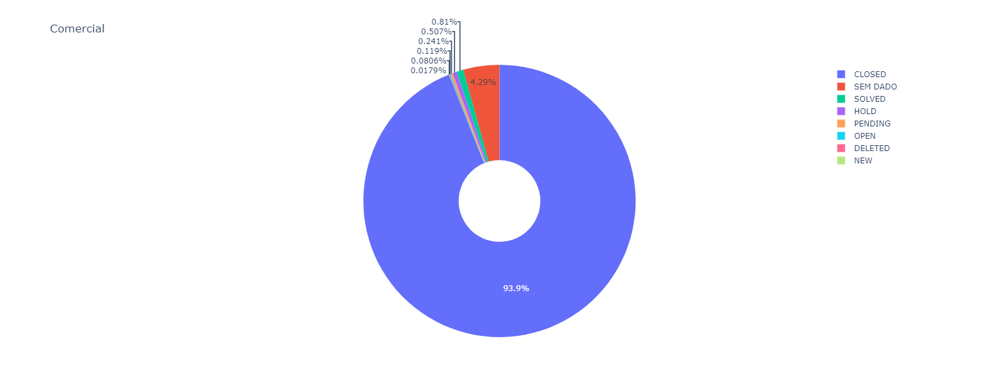

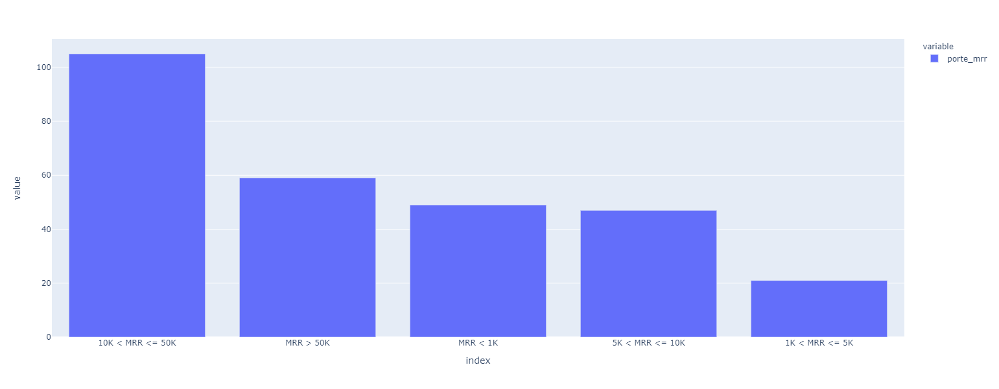

In [68]:
labels = df_zd_churn['status_ticket'].value_counts().index.tolist()

fig = go.Figure(data=[go.Pie(labels=labels, values=df_zd_churn['status_ticket'].value_counts(), hole=.3)])
fig.update_layout(width=700, height=600, title_text='Comercial')
fig.show()

fig = df_zd_churn_com.loc[ (df_zd_churn_com['status_ticket']=='PENDING') ]['porte_mrr'].value_counts().plot.bar()
fig.update_layout(width=700, height=600)
fig.show()

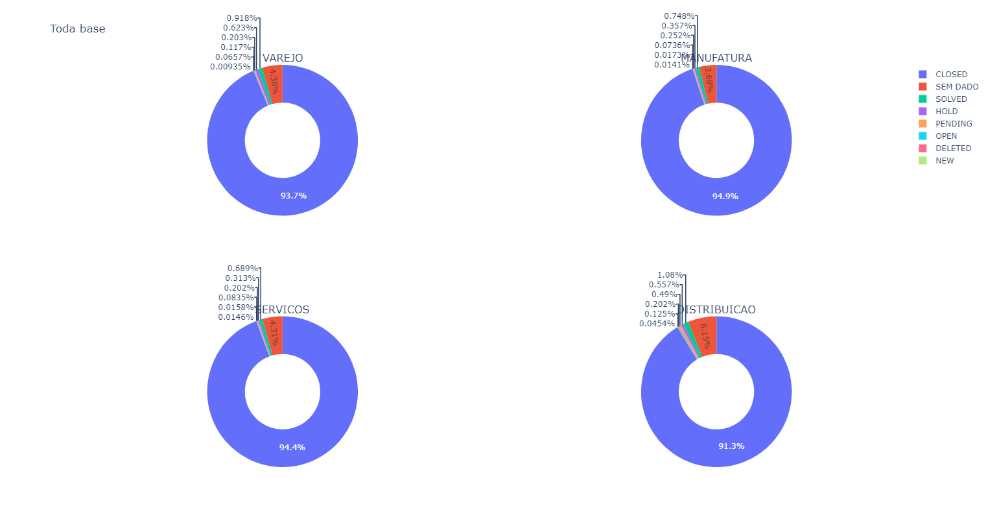

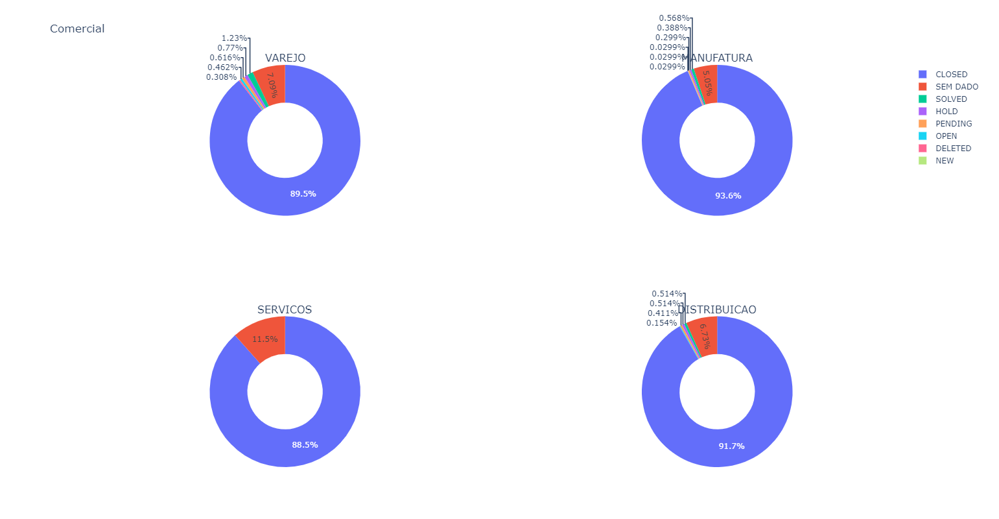

In [69]:
# ls_grupos = ['cloud','cst','cx','ouvidoria','produto','ti']
# ls_priori = ['high','low','normal','sem_dado_priori_ticket','urgent']
# ls_tp_tkt = ['incident','problem','question','sem_dado_tipo_ticket','task']
# ls_status_tkt = ['urgent','closed','deleted','hold','new','open','pending','sem_dado_status_ticket','solved']

labels = df_zd_churn.dropna().loc[df_zd_churn['ds_seg_cnta']==values[0]]['status_ticket'].value_counts().index.tolist()
values = ['VAREJO', 'MANUFATURA', 'SERVICOS', 'DISTRIBUICAO']

fig = make_subplots(rows=2, cols=2, subplot_titles=(values[0],values[1],values[2],values[3]),
                    specs=[[{"type": "domain"}, {"type": "domain"}],
                           [{"type": "domain"}, {"type": "domain"}]
                           ])

fig.add_trace(go.Pie(labels=labels, values=df_zd_churn.dropna().loc[df_zd_churn['ds_seg_cnta']==values[0]]['status_ticket'].value_counts(), name=values[0]),
              row=1, col=1)
fig.add_trace(go.Pie(labels=labels, values=df_zd_churn.dropna().loc[df_zd_churn['ds_seg_cnta']==values[1]]['status_ticket'].value_counts(), name=values[1]),
              row=1, col=2)
fig.add_trace(go.Pie(labels=labels, values=df_zd_churn.dropna().loc[df_zd_churn['ds_seg_cnta']==values[2]]['status_ticket'].value_counts(), name=values[2]),
              row=2, col=1)
fig.add_trace(go.Pie(labels=labels, values=df_zd_churn.dropna().loc[df_zd_churn['ds_seg_cnta']==values[3]]['status_ticket'].value_counts(), name=values[3]),
              row=2, col=2)


fig.update_traces(hole=.5)

fig.update_layout(
    title_text="Toda base",)
fig.update_layout(width=1000, height=800)
fig.show()

# -----------------------------------------------------------------------------------------------------------------------------------------------------------------

fig = make_subplots(rows=2, cols=2, subplot_titles=(values[0],values[1],values[2],values[3]),
                    specs=[[{"type": "domain"}, {"type": "domain"}],
                           [{"type": "domain"}, {"type": "domain"}]
                           ])

fig.add_trace(go.Pie(labels=labels, values=df_zd_churn_com.dropna().loc[df_zd_churn_com['ds_seg_cnta']==values[0]]['status_ticket'].value_counts(), name=values[0]),
              row=1, col=1)
fig.add_trace(go.Pie(labels=labels, values=df_zd_churn_com.dropna().loc[df_zd_churn_com['ds_seg_cnta']==values[1]]['status_ticket'].value_counts(), name=values[1]),
              row=1, col=2)
fig.add_trace(go.Pie(labels=labels, values=df_zd_churn_com.dropna().loc[df_zd_churn_com['ds_seg_cnta']==values[2]]['status_ticket'].value_counts(), name=values[2]),
              row=2, col=1)
fig.add_trace(go.Pie(labels=labels, values=df_zd_churn_com.dropna().loc[df_zd_churn_com['ds_seg_cnta']==values[3]]['status_ticket'].value_counts(), name=values[3]),
              row=2, col=2)


fig.update_traces(hole=.5)

fig.update_layout(
    title_text="Comercial",)
fig.update_layout(width=1000, height=800)
fig.show()

In [70]:
df_zd_churn_com.loc[ (df_zd_churn_com['ds_seg_cnta']=='DISTRIBUICAO') & (df_zd_churn_com['status_ticket']=='PENDING') ]

,cd_cnta_x,porte_mrr,ds_seg_cnta,motivo_pai,codigo_organizacao,data_criacao_fe,nome_grupo_fe,tipo_ticket,prioridade_ticket,status_ticket,titulo_ticket,cd_cnta_y,churn,avaliacao_unidade_responsavel,nota,tempo_resposta_total_seg_fe,grupo_av_un_fe,grupo_nota_fe,ano_criacao_fe
10036,TB4615,1K < MRR <= 5K,DISTRIBUICAO,Comercial,TB4615,2021-06,PRODUTO,QUESTION,LOW,PENDING,TECHFIN - SUPORTE TEF - MOTIVO: NEGADA 91 SODE...,TB4615,1.0,NaN,NaN,NaN,detrator,detrator,2021
15122,TEXHQO,10K < MRR <= 50K,DISTRIBUICAO,Comercial,TEXHQO,2021-05,PRODUTO,QUESTION,LOW,PENDING,CONCILIAÇÃO COM PAGUESEGURO,TEXHQO,1.0,NaN,NaN,NaN,detrator,detrator,2021
31115,TFCELQ,10K < MRR <= 50K,DISTRIBUICAO,Comercial,TFCELQ,2021-06,CST,QUESTION,NORMAL,PENDING,PRORROGAÇÃO DE BOLETO TOTVS,TFCELQ,1.0,NaN,NaN,NaN,detrator,detrator,2021
47370,TB1089,10K < MRR <= 50K,DISTRIBUICAO,Comercial,TB1089,2021-05,CST,QUESTION,HIGH,PENDING,RE: CANCELAMENTO DE CNPJ,TB1089,1.0,NaN,NaN,NaN,detrator,detrator,2021
67498,T43474,MRR < 1K,DISTRIBUICAO,Comercial,T43474,2021-05,PRODUTO,QUESTION,HIGH,PENDING,INCLUSÃO DE NOTA DE ENTRADA THREAD ERROR ([733...,T43474,1.0,NaN,NaN,NaN,detrator,detrator,2021
67714,T43474,MRR < 1K,DISTRIBUICAO,Comercial,T43474,2021-06,CLOUD,TASK,LOW,PENDING,NÃO ESTOU CONSEGUINDO PROMOVER RPO DO AMBIENTE...,T43474,1.0,NaN,NaN,NaN,detrator,detrator,2021
68020,T43474,MRR < 1K,DISTRIBUICAO,Comercial,T43474,2021-06,CLOUD,QUESTION,NORMAL,PENDING,[DBA] BACKUP DA TABELA SB1010 DE TODOS OS BACK...,T43474,1.0,NaN,NaN,NaN,detrator,detrator,2021
69595,TB3577,5K < MRR <= 10K,DISTRIBUICAO,Comercial,TB3577,2021-05,CST,QUESTION,HIGH,PENDING,ALTERAÇÃO DE TITULARIDADES E PAGAMENTOS,TB3577,1.0,NaN,NaN,NaN,detrator,detrator,2021
69692,TB4413,1K < MRR <= 5K,DISTRIBUICAO,Comercial,TB4413,2021-06,PRODUTO,QUESTION,LOW,PENDING,AUMENTAR LIMITE DE CRÉDITO NA ROTINA 1203,TB4413,1.0,NaN,NaN,NaN,detrator,detrator,2021
69879,TB5520,5K < MRR <= 10K,DISTRIBUICAO,Comercial,TB5520,2021-05,PRODUTO,QUESTION,HIGH,PENDING,TROCAR CNPJ TEF,TB5520,1.0,NaN,NaN,NaN,detrator,detrator,2021


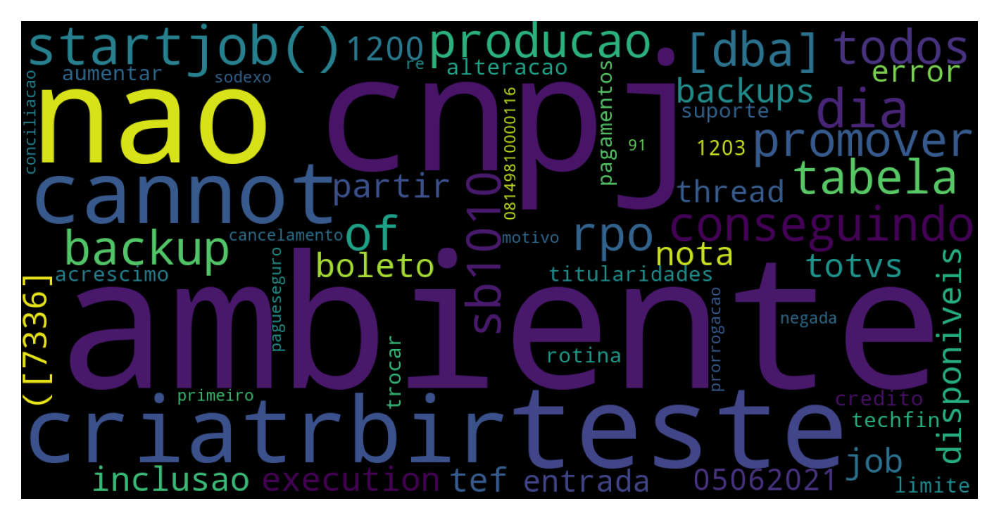

In [71]:
_, freq_words = wordcloud(df_zd_churn_com.loc[ (df_zd_churn_com['ds_seg_cnta']=='DISTRIBUICAO') & (df_zd_churn_com['status_ticket']=='PENDING') ], 'titulo_ticket')

In [72]:
df_zd_churn_com.loc[ (df_zd_churn_com['ds_seg_cnta']=='DISTRIBUICAO') & (df_zd_churn_com['status_ticket']=='PENDING') & (df_zd_churn_com['titulo_ticket'].str.lower().str.contains('backup|bkp|back up|backups')) ]['titulo_ticket'].value_counts()

[DBA] BACKUP DA TABELA SB1010 DE TODOS OS BACKUPS DISPONIVEIS A PARTIR DO 05/06/2021 AS 12:00 EM DIA    2
Name: titulo_ticket, dtype: int64

### Padroes

add o periodo que o cliente fica

depois fazer pelos clientes mais valiosos

In [73]:
# Pegando 1% dos clientes que mais abrem chamado na zendesk
top_cli_zendesk = df_zendesk_mod.groupby('codigo_organizacao').sum()[['cloud','cst','cx','ouvidoria','produto','ti']].sum(axis=1).sort_values(ascending=False)[1:547]

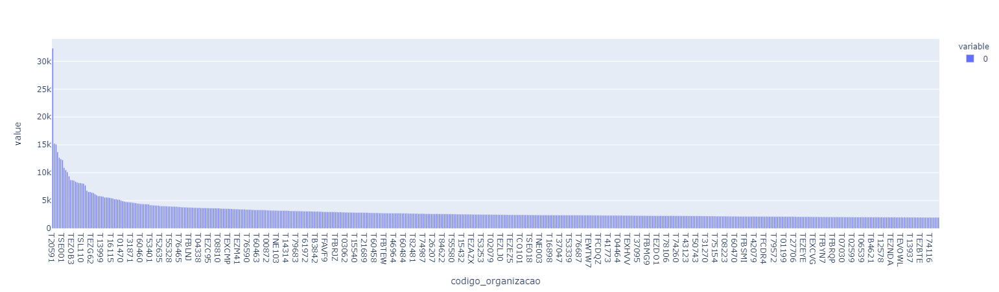

In [74]:
top_cli_zendesk.plot.bar()

In [75]:
top_cli_zd_contrato = top_cli_zendesk.to_frame().merge(df_contrato, left_on=top_cli_zendesk.to_frame().index, right_on='cd_cli', how='left').drop_duplicates(subset=['cd_cli'])

**exercicio com o cliente que mais abre chamado**

In [76]:
# já conferi, e nesse contrato só consta esse cliente
top_cli_zd_contrato.loc[top_cli_zd_contrato['cd_cli']=='T20591']

,0,Unnamed: 0,nr_cont,cd_cli_destino,nr_proposta,hospedagem,nm_vendedor,nm_gar,nm_unde_canal,nm_unde_vnda,cd_cli,nm_cli,cnpj,cidade,uf,cep,pais,ds_segmento,ds_subsegmento,ds_cnae,fat_estimado,metrica_inf,metrica_dec,metrica_inf_dec,metrica_tipo,fat_origem,fat_faixa,cd_prod,ds_prod,cd_gp,ds_gp,gp_recorrente,cd_lin_rec,ds_lin_rec,agrupamento,agrupamento_meta,modalidade,seg_totvs,seg_intera,licenciamento,grp_solucao,marca_totvs,tab_prc,area_resp,modal_comerc,abrangencia,nm_oferta_sb1,dt_assinatura_contrato,dt_proposta,dt_upload,qtd,vl_incremento_total,vl_total_contrato,vl_unitario,periodicidade,situacao_contrato,sts_contrato,dt_refer_prod,recorrente,ds_nm_oferta,familia,tp_crm_2,dt_prim_contrato,tp_tcfgd,tp_final,ordem,tp_inicial,tp_cli,tp_vnda,erp,fluig,gooddata,backoffice,segmentos,rh,grp_solucao_combinado,grp_solucao_erp,tem_erp,tem_fluig,tem_gooddata,tem_backoffice,tem_segmentos,tem_rh,cliente_novo_intera,tipo_cliente_intera,pacote_complementar,totvs_cloud_pacote_complementar,cloud,app,tem_app,recorrente_total_cloud,recorrente_app,recorrente_intera,fat_estimado_orbis,dt_assinatura_contrato_fe,div_periodicidade_aux,vl_total_contrato_fe,cd_cnta,churn_cliente,master_key,churn_contrato,porte_mrr_aux,porte_mrr
0,32304,33870.0,CONT20591,T20591,853550,TOTVS CLOUD,MIRIAM MOREIRA DA COSTA CALVINO,FRANCISCO PAULO LAGATTA JUNIOR,TOTVS SAO PAULO,TOTVS SAO PAULO,T20591,VALDAC LTDA,45842622000103,SAO PAULO,SP,4041004,105,MANUFATURA,BENS DE CONSUMO,Comercio varejista de artigos do vestuario e a...,Faixa 07 - De 75 M até 150 M,32136170.64,0.0,32136170.64,SEM DADO,INFORMADA,Faixa 04 - De 25 M até 35 M,2126091002,va-plus-cloud-mens-v,22S4,SV ALUGUEL VIRTUAL AGE,Sim,253.0,SAAS SERIE T,0253-SAAS SERIE T,SAAS SERIE T,ALUGUEL,SEM DADO,SEM DADO,subscricao,CLOUD,VIRTUAL AGE,TABELA NOVOS NEGÓCIOS,V&D - MODA,NOVOS NEGÓCIOS,SEM DADO,TOTVS MODA,2017-03-31,2016-12-06,2017-03-31,21.0,0.0,0.25,0.01,00 - Mensal,CANCELADO,003 - CANCELADO,2015-01-20,Sim,SEM DADO,SEM DADO,SEM DADO,SEM DADO,SEM DADO,SEM DADO,3.0,SEM DADO,SEM DADO,SEM DADO,0.0,0.0,0.0,0.0,0.0,0.0,Novo Intera Fluig + GoodData,Novo Intera Fluig + GoodData,0.0,0.0,0.0,0.0,0.0,0.0,Não tem Novo Intera,SEM DADO,0.0,0.0,TOTVS CLOUD,0.0,Sem APP,0.0,0.0,0.0,Faixa 08 - De 150 M até 300 M,2017-03,1.0,0.25,T20591,1.0,CONT20591T20591va-plus-cloud-mens-v,0.0,95549.04,MRR > 50K


In [77]:
df_churn.loc[df_churn['cd_cnta']=='T20591']  # manufatura, comercial, aplicativos e add-ons, drg:sp, MRR > 50K , faixa 4, 30 meses contrato, cacelamento total

,cd_cnta,nm_cnta,cd_contrato,cd_item,cd_planilha,ds_seg_cnta,ds_prod,dt_compet,canc_mensal,tipo_cancel,lin_receita,tipo_motivo,motivo_agrup,nome_oferta,marca_totvs,vertical,unid_agrup,acionavel,motivo_pai,porte_mrr,propensao_20210312,tipo_cliente,cliente_moni,estado,faixa_faturamento,codigo_guarda_chuva,uso_perc_produto,dt_assinatura,tempo_contrato_(m),tempo_contrato_(a),ano_cancel,tri_cancel,migrado_intera,usa_cloud,usa_servicos,canc_mensal_10,protheus,totvs_full_light,rm,datasul,logix,ls_2010_2011,pims,sara,dt_compet_fe,master_key,churn
37178,T20591,VALDAC LTDA,CONT20591,12,4,MANUFATURA,app-retailapp-men-31-a-150,2021-04-01,4238.00,PARCIAL,SUBSCRIÇÃO,Motivos Internos,Comercial,APP RETAILAPP,APLICATIVOS E ADD-ONS,SUPPLY,DRG: SAO PAULO - RECEITAS,Acionável,Comercial,MRR > 50K,PROPENSÃO MÉDIA,Padrao,Nao,SP,Faixa 04 - De 25 M até 35 M,T20591,-0.01,2018-09-27,30.0,2.0,2021,2T21,0,1,0,0,1,1,1,0,0,0,0,0,2021-04,CONT20591T20591app-retailapp-men-31-a-150,1
37179,T20591,VALDAC LTDA,CONT20591,13,4,MANUFATURA,app-retailapp-men-31-a-150,2021-04-01,1949.48,PARCIAL,SUBSCRIÇÃO,Motivos Internos,Comercial,APP RETAILAPP,APLICATIVOS E ADD-ONS,SUPPLY,DRG: SAO PAULO - RECEITAS,Acionável,Comercial,MRR > 50K,PROPENSÃO MÉDIA,Padrao,Nao,SP,Faixa 04 - De 25 M até 35 M,T20591,-0.01,2018-09-27,30.0,2.0,2021,2T21,0,1,0,0,1,1,1,0,0,0,0,0,2021-04,CONT20591T20591app-retailapp-men-31-a-150,1
37180,T20591,VALDAC LTDA,CONT20591,14,4,MANUFATURA,app-retailapp-mens-1-a-30,2021-04-01,2542.80,PARCIAL,SUBSCRIÇÃO,Motivos Internos,Comercial,APP RETAILAPP,APLICATIVOS E ADD-ONS,SUPPLY,DRG: SAO PAULO - RECEITAS,Acionável,Comercial,MRR > 50K,PROPENSÃO MÉDIA,Padrao,Nao,SP,Faixa 04 - De 25 M até 35 M,T20591,-0.01,2018-09-27,30.0,2.0,2021,2T21,0,1,0,0,1,1,1,0,0,0,0,0,2021-04,CONT20591T20591app-retailapp-mens-1-a-30,1


In [78]:
print(df_zendesk.loc[df_zendesk['codigo_organizacao']=='T20591']['nome_grupo_fe'].value_counts())
print(df_zendesk.loc[df_zendesk['codigo_organizacao']=='T20591']['tipo_ticket'].value_counts())
print(df_zendesk.loc[df_zendesk['codigo_organizacao']=='T20591']['prioridade_ticket'].value_counts())
print(df_zendesk.loc[df_zendesk['codigo_organizacao']=='T20591']['status_ticket'].value_counts())

PRODUTO    30357
CST         1845
CLOUD        102
Name: nome_grupo_fe, dtype: int64
QUESTION    22741
SEM DADO     7216
TASK          834
PROBLEM       815
INCIDENT      698
Name: tipo_ticket, dtype: int64
LOW         17364
SEM DADO     7206
NORMAL       4176
HIGH         3407
URGENT        151
Name: prioridade_ticket, dtype: int64
CLOSED      24892
SEM DADO     7203
SOLVED        193
PENDING         6
OPEN            5
DELETED         3
HOLD            2
Name: status_ticket, dtype: int64


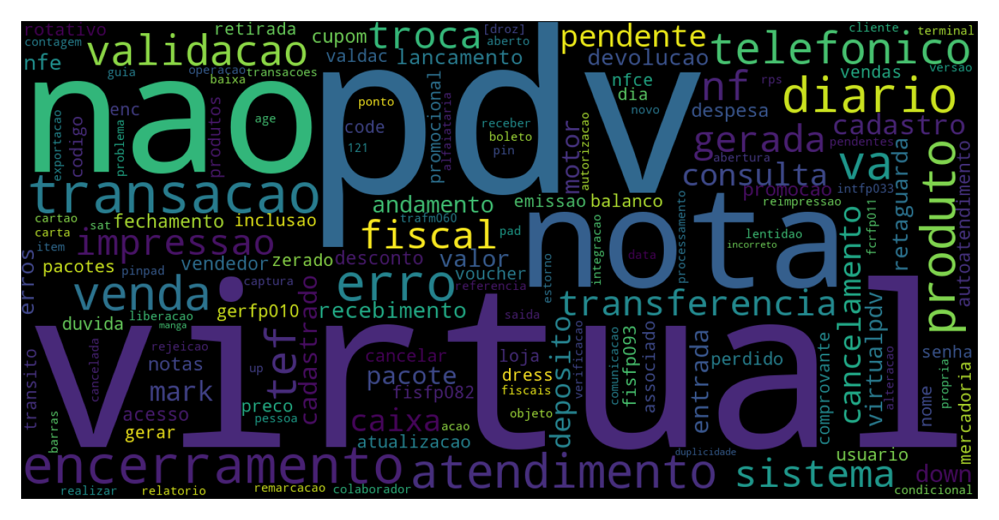

In [79]:
_, freq_words = wordcloud(df_zendesk.loc[ (df_zendesk['codigo_organizacao']=='T20591') ], 'titulo_ticket')

In [80]:
freq_words

,word,freq
4,virtual,2660
5,pdv,2634
20,nao,2454
14,nota,2020
1,transacao,1909
8,encerramento,1762
47,erro,1639
9,diario,1476
22,produto,1357
24,va,1339


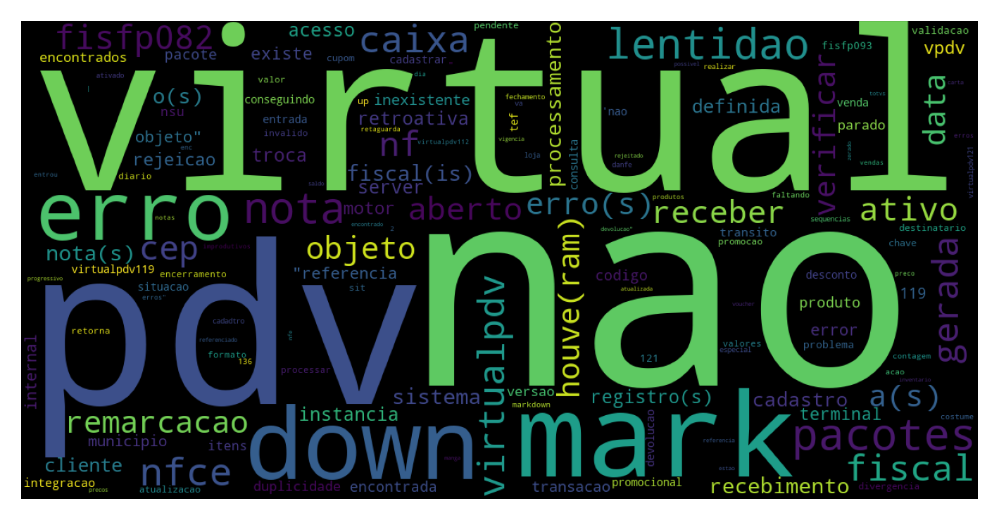

In [81]:
_, freq_words = wordcloud(df_zendesk.loc[ (df_zendesk['codigo_organizacao']=='T20591') & (df_zendesk['tipo_ticket']=='INCIDENT') ], 'titulo_ticket')

In [82]:
freq_words

,word,freq
9,nao,170
63,virtual,165
64,pdv,163
43,mark,96
44,down,86
108,erro,57
46,pacotes,50
54,nota,48
87,lentidao,47
3,nfce,38


**Base**

In [83]:
df_contrato['churn_contrato'].value_counts(normalize=True)

0.0    0.928497
1.0    0.071503
Name: churn_contrato, dtype: float64

In [84]:
top_cli_zd_contrato['churn_contrato'].value_counts(normalize=True)  # aqui temos uma variação da proporção de churn que considero não ser tao relevante, mas a nossa amostra sobe quase 2% em churn

0.0    0.911937
1.0    0.088063
Name: churn_contrato, dtype: float64

In [85]:
df_contrato['churn_cliente'].value_counts(normalize=True)

0.0    0.806328
1.0    0.193672
Name: churn_cliente, dtype: float64

In [86]:
top_cli_zd_contrato['churn_cliente'].value_counts(normalize=True)  # quando falamos de cliente, temos um aumento significativo de aprox 26% de churn na amostra top

0.0    0.547945
1.0    0.452055
Name: churn_cliente, dtype: float64

In [87]:
# Filtrando os clientes na zendesk
df_zendesk_top = df_zendesk.merge(top_cli_zd_contrato['cd_cli'], left_on='codigo_organizacao', right_on='cd_cli', how='left').dropna(subset=['cd_cli'])

In [88]:
print(df_zendesk_top['codigo_organizacao'].nunique(), '/', df_zendesk['codigo_organizacao'].nunique(), ' = ',  round((df_zendesk_top['codigo_organizacao'].nunique()/df_zendesk['codigo_organizacao'].nunique())*100, 2))

546 / 54600  =  1.0


In [89]:
# os 1% dos clientes representam 13,6% dos chamados da base zendesk
print(len(df_zendesk_top), '/', len(df_zendesk), ' = ',  round((len(df_zendesk_top)/len(df_zendesk))*100, 2))

1701865 / 12515851  =  13.6


In [90]:
# o cliente é sempre do mesmo segmento
df_contrato.loc[df_contrato['cd_cli']=='T20591']['ds_segmento'].value_counts()

MANUFATURA    26
Name: ds_segmento, dtype: int64

In [91]:
# df_zendesk[df_zendesk.duplicated()]
# x = df_zendesk.merge(df_contrato[['cd_cli','ds_segmento']], left_on='codigo_organizacao', right_on='cd_cli', how='left').drop_duplicates()
# x.dropna()

**quanto vale os 1% dos clientes que mais abrem chamado**

In [92]:
print(top_cli_zd_contrato['porte_mrr_aux'].sum())  # 69MM MRR

69318484.3


**Qual a media de avaliação dos clientes que mais abrem os chamados**

In [93]:
df_nps['avaliacao_unidade_responsavel'].mean()

8.176598263614839

In [94]:
df_nps['nota'].mean()

8.013220205209155

In [95]:
df_nps['vale_a_pena'].value_counts(normalize=True)

Sim         0.888911
Não Sabe    0.062352
Não         0.048737
Name: vale_a_pena, dtype: float64

In [96]:
df_nps['entrega_de_beneficio_do_software'].value_counts(normalize=True)

Entregou Totalmente      0.710339
Entregou Parcialmente    0.221586
SEM DADO                 0.036306
Não Entregou             0.031768
Name: entrega_de_beneficio_do_software, dtype: float64

In [97]:
df_nps_top = df_nps.merge(top_cli_zd_contrato['cd_cli'], left_on='cod_unidade', right_on='cd_cli', how='left').dropna(subset=['cd_cli'])

In [98]:
df_nps_top['avaliacao_unidade_responsavel'].mean()

8.098781270044901

In [99]:
df_nps_top['nota'].mean()

7.9108402822322

In [100]:
df_nps_top['vale_a_pena'].value_counts(normalize=True)  # nao muda muito, mas temos um aumento de 'nao sabe' e 'nao'

Sim         0.865298
Não Sabe    0.072482
Não         0.062219
Name: vale_a_pena, dtype: float64

In [101]:
df_nps_top['entrega_de_beneficio_do_software'].value_counts(normalize=True)  # 'nao entregou' aqui sobre, e 'entregou totalmente' cai

Entregou Totalmente      0.678640
Entregou Parcialmente    0.250160
Não Entregou             0.037845
SEM DADO                 0.033355
Name: entrega_de_beneficio_do_software, dtype: float64

**segmento**

In [102]:
df_contrato['ds_segmento'].value_counts()[:10]

MANUFATURA               149571
SERVICOS                 115705
VAREJO                   107518
HOSPITALITY               55130
LOGISTICA                 44025
CONSTRUCAO E PROJETOS     39807
DISTRIBUICAO              29933
EDUCACIONAL               27608
SAUDE                     27568
AGROINDUSTRIA             15356
Name: ds_segmento, dtype: int64

In [103]:
top_cli_zd_contrato['ds_segmento'].value_counts()[:5]  # Saude aparece com uma grande parcela

MANUFATURA    174
VAREJO         79
SERVICOS       77
LOGISTICA      45
SAUDE          44
Name: ds_segmento, dtype: int64

In [104]:
top_cli_zd_contrato.loc[top_cli_zd_contrato['churn_contrato']==1.0]['ds_segmento'].value_counts()[:5]  # varejo passou de 10%, ta quase em 50%

MANUFATURA               16
VAREJO                   13
SERVICOS                  6
LOGISTICA                 3
CONSTRUCAO E PROJETOS     2
Name: ds_segmento, dtype: int64

In [105]:
top_cli_zd_contrato.loc[top_cli_zd_contrato['churn_cliente']==1.0]['ds_segmento'].value_counts()[:5]

MANUFATURA    79
VAREJO        36
SERVICOS      32
SAUDE         23
LOGISTICA     20
Name: ds_segmento, dtype: int64

In [106]:
df_nps_top.loc[df_nps_top['segmento']=='SAUDE']['avaliacao_unidade_responsavel'].mean()

7.594936708860759

In [107]:
df_nps_top.loc[df_nps_top['segmento']=='SAUDE']['nota'].mean()

7.594936708860759

In [108]:
top_cli_zd_contrato.loc[top_cli_zd_contrato['ds_segmento']=='SAUDE']['churn_cliente'].value_counts(normalize=True)

1.0    0.522727
0.0    0.477273
Name: churn_cliente, dtype: float64

In [109]:
top_cli_zd_contrato.loc[ (top_cli_zd_contrato['ds_segmento']=='SAUDE') & (top_cli_zd_contrato['churn_cliente']==1.0) ]['porte_mrr_aux'].sum()  # Esses clientes representam 7MM em MRR

7967837.3100000005

In [110]:
df_zendesk_top = df_zendesk_top.reset_index().merge(df_contrato[['cd_cli','porte_mrr','ds_segmento']], left_on='codigo_organizacao', right_on='cd_cli', how='left').drop_duplicates()

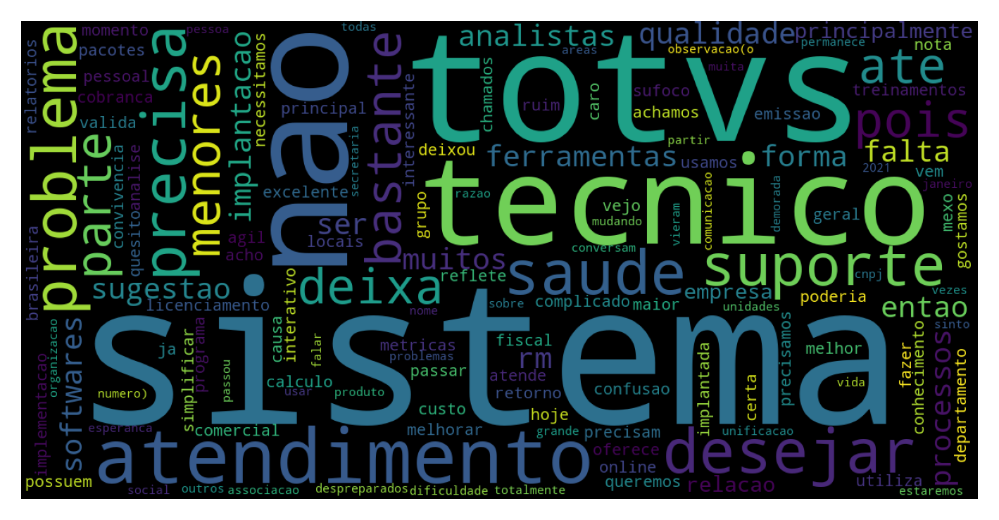

In [111]:
_, freq_words = wordcloud(df_nps_top.loc[ (df_nps_top['segmento']=='SAUDE') & (df_nps_top['churn_nps']==1.0) ], 'comentario')

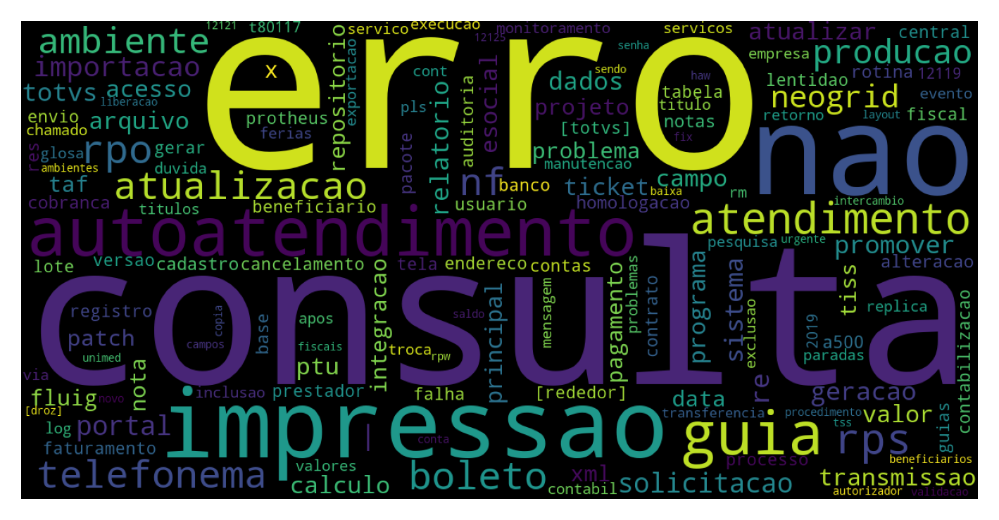

In [112]:
_, freq_words = wordcloud(df_zendesk_top.loc[ (df_zendesk_top['ds_segmento']=='SAUDE') & (df_zendesk_top['churn']==1.0) ], 'titulo_ticket')

**porte mrr**

em todos de > 50k e 10k a 50K ta a cima

In [113]:
df_contrato['porte_mrr'].value_counts()

MRR < 1K            181415
10k <= MRR < 50K    162234
1k <= MRR < 5K      125134
5k <= MRR < 10K      83765
MRR > 50K            66736
Name: porte_mrr, dtype: int64

In [114]:
top_cli_zd_contrato['porte_mrr'].value_counts()

MRR > 50K           305
10k <= MRR < 50K    172
5k <= MRR < 10K      15
1k <= MRR < 5K       11
MRR < 1K              8
Name: porte_mrr, dtype: int64

In [115]:
top_cli_zd_contrato.loc[top_cli_zd_contrato['churn_contrato']==1.0]['porte_mrr'].value_counts()

MRR > 50K           31
10k <= MRR < 50K    10
5k <= MRR < 10K      2
1k <= MRR < 5K       1
MRR < 1K             1
Name: porte_mrr, dtype: int64

In [116]:
top_cli_zd_contrato.loc[top_cli_zd_contrato['churn_cliente']==1.0]['porte_mrr'].value_counts()

MRR > 50K           152
10k <= MRR < 50K     64
1k <= MRR < 5K        6
5k <= MRR < 10K       5
MRR < 1K              4
Name: porte_mrr, dtype: int64

In [117]:
df_nps_top = df_nps_top.reset_index().merge(df_contrato[['cd_cli','porte_mrr']], left_on='cod_cliente', right_on='cd_cli', how='left').drop_duplicates()

In [118]:
df_nps_top.loc[df_nps_top['porte_mrr']=='MRR > 50K']['avaliacao_unidade_responsavel'].mean()

8.272727272727273

In [119]:
df_nps_top.loc[df_nps_top['porte_mrr']=='MRR > 50K']['nota'].mean()

8.008264462809917

In [120]:
top_cli_zd_contrato.loc[top_cli_zd_contrato['porte_mrr']=='MRR > 50K']['churn_cliente'].value_counts(normalize=True)  # media de cancelamento tambem maior

0.0    0.501639
1.0    0.498361
Name: churn_cliente, dtype: float64

In [121]:
top_cli_zd_contrato.loc[ (top_cli_zd_contrato['porte_mrr']=='MRR > 50K') & (top_cli_zd_contrato['churn_cliente']==1.0) ]['porte_mrr_aux'].sum()  # Esses clientes representam 4MM em MRR

39798517.14

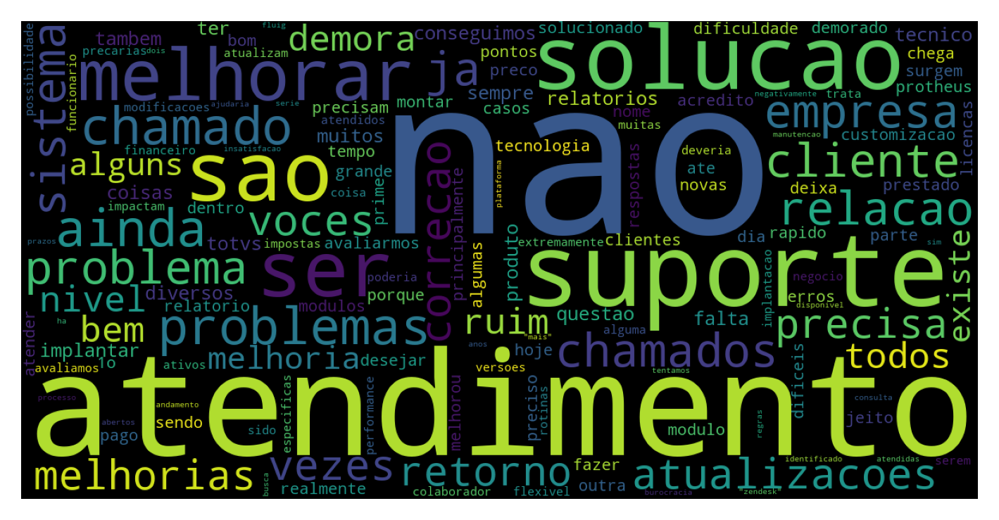

In [122]:
_, freq_words = wordcloud(df_nps_top.loc[ (df_nps_top['porte_mrr']=='MRR > 50K') & (df_nps_top['churn_nps']==1.0) ], 'comentario')

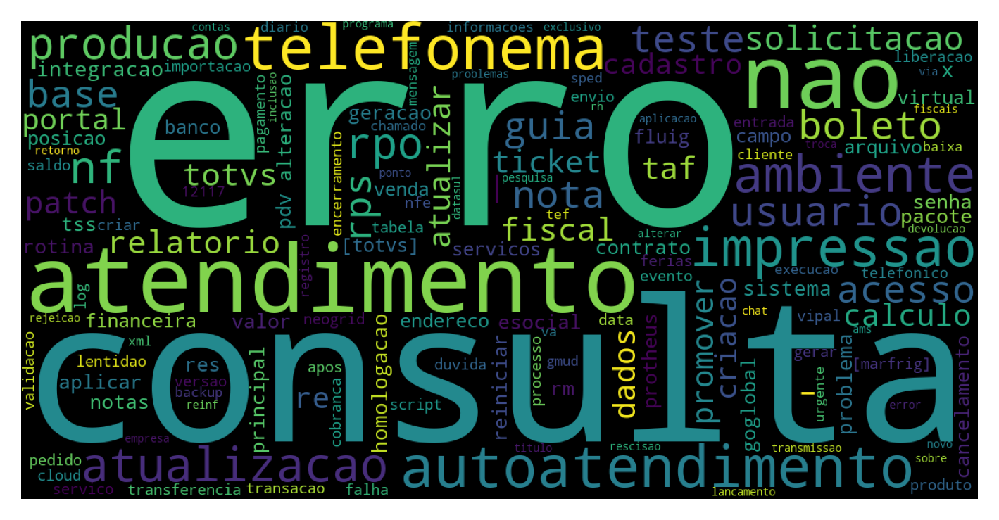

In [123]:
_, freq_words = wordcloud(df_zendesk_top.loc[ (df_zendesk_top['porte_mrr']=='MRR > 50K') & (df_zendesk_top['churn']==1.0) ], 'titulo_ticket')

**faixa faturamento**

olhar faixa 7 e 8

In [124]:
df_contrato['fat_faixa'].value_counts()[:5]

Sem Informações de Faturamento    299624
Faixa 00 - Até 4,5 M               77342
Faixa 02 - De 7,5 M até 15 M       39936
Faixa 03 - De 15 M até 25 M        32694
Faixa 07 - De 75 M até 150 M       29588
Name: fat_faixa, dtype: int64

In [125]:
top_cli_zd_contrato['fat_faixa'].value_counts()[:5]

Faixa 08 - De 150 M até 300 M    81
Faixa 07 - De 75 M até 150 M     74
Faixa 11 - Acima de 850 M        46
Faixa 06 - De 50 M até 75 M      45
Faixa 09 - De 300 M até 500 M    45
Name: fat_faixa, dtype: int64

In [126]:
top_cli_zd_contrato.loc[top_cli_zd_contrato['churn_contrato']==1.0]['fat_faixa'].value_counts()[:5]

Faixa 07 - De 75 M até 150 M     10
Faixa 03 - De 15 M até 25 M       6
Faixa 11 - Acima de 850 M         5
Faixa 04 - De 25 M até 35 M       4
Faixa 09 - De 300 M até 500 M     4
Name: fat_faixa, dtype: int64

In [127]:
top_cli_zd_contrato.loc[top_cli_zd_contrato['churn_cliente']==1.0]['fat_faixa'].value_counts()[:5]

Faixa 07 - De 75 M até 150 M     42
Faixa 08 - De 150 M até 300 M    29
Faixa 11 - Acima de 850 M        24
Faixa 06 - De 50 M até 75 M      20
Faixa 09 - De 300 M até 500 M    18
Name: fat_faixa, dtype: int64

**marca totvs**

olhar APLICATIVOS E ADD-ONS

In [128]:
df_contrato['marca_totvs'].value_counts()[:5]

TRADICIONAL            259484
TOTVS HOSPITALIDADE     56508
ELEVE                   55035
TECNOLOGIA              42955
PC SISTEMAS             25770
Name: marca_totvs, dtype: int64

In [129]:
top_cli_zd_contrato['marca_totvs'].value_counts()[:5]

TRADICIONAL              134
APLICATIVOS E ADD-ONS     58
TECNOLOGIA                50
FLUIG                     39
SERVIÇOS                  36
Name: marca_totvs, dtype: int64

In [130]:
top_cli_zd_contrato.loc[top_cli_zd_contrato['churn_contrato']==1.0]['marca_totvs'].value_counts()[:5]

TRADICIONAL              11
APLICATIVOS E ADD-ONS     6
TECHFIN                   5
INTERA ID 17/18           4
TECNOLOGIA                4
Name: marca_totvs, dtype: int64

In [131]:
top_cli_zd_contrato.loc[top_cli_zd_contrato['churn_cliente']==1.0]['marca_totvs'].value_counts()[:5]

TRADICIONAL              59
APLICATIVOS E ADD-ONS    36
TECNOLOGIA               23
CLOUD                    17
SERVIÇOS                 16
Name: marca_totvs, dtype: int64

**Comercial**

In [132]:
df_zd_churn_top = df_zd_churn.merge(top_cli_zd_contrato['cd_cli'], left_on='codigo_organizacao', right_on='cd_cli', how='left').dropna()

In [133]:
top_cli_zd_contrato['cd_cli'].nunique()

546

In [134]:
len(df_zd_churn_top)

670351

In [135]:
df_zd_churn_top['codigo_organizacao'].nunique()  # reduziu pela metade por conta da quantidade de churn 

238

In [136]:
df_zd_churn_top['motivo_pai'].value_counts()

Administrativo    210104
Financeiro        158047
Produto           145178
Serviços           77829
Comercial          55073
Suporte            21848
Pandemia            2272
Name: motivo_pai, dtype: int64

In [137]:
df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['ds_seg_cnta']=='SAUDE') ]

,cd_cnta_x,porte_mrr,ds_seg_cnta,motivo_pai,codigo_organizacao,data_criacao_fe,nome_grupo_fe,tipo_ticket,prioridade_ticket,status_ticket,titulo_ticket,cd_cnta_y,churn,cd_cli
1379051,TEZSOE,10K < MRR <= 50K,SAUDE,Comercial,TEZSOE,2020-07,PRODUTO,SEM DADO,SEM DADO,SEM DADO,SEM DADO,TEZSOE,1.0,TEZSOE
1379052,TEZSOE,10K < MRR <= 50K,SAUDE,Comercial,TEZSOE,2019-01,CST,QUESTION,HIGH,CLOSED,"CONSULTA E IMPRESSÃO DE NF, BOLETO, RPS E GUIA",TEZSOE,1.0,TEZSOE
1379053,TEZSOE,10K < MRR <= 50K,SAUDE,Comercial,TEZSOE,2019-10,PRODUTO,QUESTION,NORMAL,CLOSED,ATENDIMENTO DE TELEFONEMA,TEZSOE,1.0,TEZSOE
1379054,TEZSOE,10K < MRR <= 50K,SAUDE,Comercial,TEZSOE,2019-03,PRODUTO,QUESTION,LOW,CLOSED,ATENDIMENTO DE TELEFONEMA,TEZSOE,1.0,TEZSOE
1379055,TEZSOE,10K < MRR <= 50K,SAUDE,Comercial,TEZSOE,2019-08,CST,TASK,NORMAL,CLOSED,CONSULTA AUTOATENDIMENTO: CONSULTA DE CONTRATO...,TEZSOE,1.0,TEZSOE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2191366,T08223,10K < MRR <= 50K,SAUDE,Comercial,T08223,2020-03,PRODUTO,QUESTION,URGENT,CLOSED,RE: [TOTVS] SOLICITAÇÃO ATUALIZADA Nº 8491881 ...,T08223,1.0,T08223
2191367,T08223,10K < MRR <= 50K,SAUDE,Comercial,T08223,2019-01,PRODUTO,QUESTION,HIGH,CLOSED,ERRO AO SELECIONAR TÍTULOS EM LIQUIDAÇÃO.,T08223,1.0,T08223
2191368,T08223,10K < MRR <= 50K,SAUDE,Comercial,T08223,2018-09,PRODUTO,INCIDENT,LOW,CLOSED,MATA103,T08223,1.0,T08223
2191369,T08223,10K < MRR <= 50K,SAUDE,Comercial,T08223,2018-06,PRODUTO,QUESTION,URGENT,CLOSED,ERRO SELECIONA LOCAL (E-SOCIAL),T08223,1.0,T08223


In [138]:
df_zd_churn_top.loc[df_zd_churn_top['motivo_pai']=='Comercial']['porte_mrr'].value_counts()

MRR > 50K           32963
10K < MRR <= 50K    11015
MRR < 1K             6848
1K < MRR <= 5K       2894
5K < MRR <= 10K      1353
Name: porte_mrr, dtype: int64

In [139]:
df_zd_churn_top.loc[df_zd_churn_top['motivo_pai']=='Comercial']['ds_seg_cnta'].value_counts()

MANUFATURA               24055
VAREJO                   11015
LOGISTICA                 5298
SERVICOS                  4030
SAUDE                     3574
AGROINDUSTRIA             2518
EDUCACIONAL               2365
CONSTRUCAO E PROJETOS     2218
Name: ds_seg_cnta, dtype: int64

**Produtos**

olhar ouvidoria e cloud - porque foi identificado lá em cima

In [140]:
df_zendesk['nome_grupo_fe'].value_counts()

PRODUTO      7751400
CST          3284258
CLOUD        1109215
TI            283775
OUVIDORIA      82102
CX              5101
Name: nome_grupo_fe, dtype: int64

In [141]:
df_zd_churn_top['nome_grupo_fe'].value_counts()

PRODUTO      440822
CLOUD        151593
CST           71941
OUVIDORIA      5473
TI              517
CX                5
Name: nome_grupo_fe, dtype: int64

In [142]:
df_zd_churn_top.loc[df_zd_churn_top['motivo_pai']=='Comercial']['nome_grupo_fe'].value_counts()

PRODUTO      36829
CLOUD        12681
CST           5274
OUVIDORIA      263
TI              26
Name: nome_grupo_fe, dtype: int64

In [143]:
df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['porte_mrr']=='MRR > 50K') ]['nome_grupo_fe'].value_counts()

PRODUTO      24721
CLOUD         6043
CST           2119
OUVIDORIA       72
TI               8
Name: nome_grupo_fe, dtype: int64

**Cloud**

In [144]:
df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['nome_grupo_fe']=='CLOUD') ]['porte_mrr'].value_counts(normalize=True)  # aprox 82% estao concentrados nos clientes mais valiosos

MRR > 50K           0.476540
10K < MRR <= 50K    0.349815
1K < MRR <= 5K      0.086744
MRR < 1K            0.086507
5K < MRR <= 10K     0.000394
Name: porte_mrr, dtype: float64

In [145]:
# temos muitos chamados urgent, comparado com opadrao
# o padrao high > urgent
df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['nome_grupo_fe']=='CLOUD') ]['prioridade_ticket'].value_counts()

NORMAL      7681
LOW         3190
URGENT       830
HIGH         762
SEM DADO     218
Name: prioridade_ticket, dtype: int64

In [146]:
df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['nome_grupo_fe']=='CLOUD') & ( (df_zd_churn_top['porte_mrr']=='MRR > 50K') | (df_zd_churn_top['porte_mrr']=='10K < MRR <= 50K') ) ]['ds_seg_cnta'].value_counts()

SERVICOS                 2514
LOGISTICA                2084
MANUFATURA               1949
EDUCACIONAL              1460
CONSTRUCAO E PROJETOS     951
SAUDE                     864
AGROINDUSTRIA             657
Name: ds_seg_cnta, dtype: int64

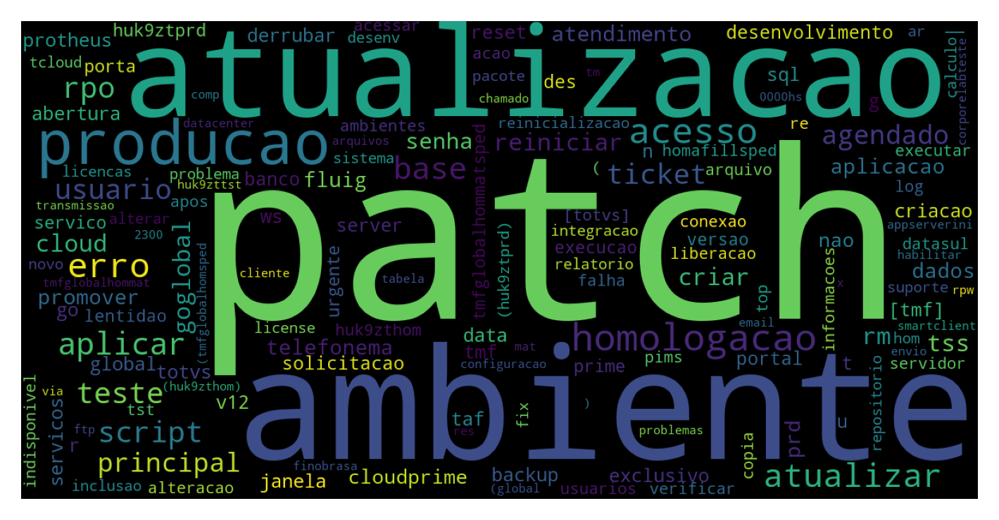

In [147]:
_, freq_words = wordcloud(df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['nome_grupo_fe']=='CLOUD') & ( (df_zd_churn_top['porte_mrr']=='MRR > 50K') | (df_zd_churn_top['porte_mrr']=='10K < MRR <= 50K') ) ], 'titulo_ticket')

In [148]:
freq_words

,word,freq
37,patch,1397
67,ambiente,1302
92,atualizacao,1018
11,producao,954
159,homologacao,866
4,acesso,806
22,erro,726
36,atualizar,675
53,base,624
65,aplicar,619


**Ouvidoria**

In [149]:
df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['nome_grupo_fe']=='OUVIDORIA') ]['porte_mrr'].value_counts(normalize=True)  # aprox 61% estao concentrados nos clientes mais valiosos

10K < MRR <= 50K    0.387833
MRR > 50K           0.273764
1K < MRR <= 5K      0.231939
MRR < 1K            0.106464
Name: porte_mrr, dtype: float64

In [150]:
# não temos tickets abertos que nao sejam normais
df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['nome_grupo_fe']=='OUVIDORIA') ]['prioridade_ticket'].value_counts()

NORMAL      211
SEM DADO     51
LOW           1
Name: prioridade_ticket, dtype: int64

In [151]:
# não temos tickets abertos que nao sejam questoes
df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['nome_grupo_fe']=='OUVIDORIA') ]['tipo_ticket'].value_counts()

QUESTION    212
SEM DADO     51
Name: tipo_ticket, dtype: int64

In [152]:
# não temos tickets abertos que nao sejam encerrados
df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['nome_grupo_fe']=='OUVIDORIA') ]['status_ticket'].value_counts()

CLOSED      211
SEM DADO     51
SOLVED        1
Name: status_ticket, dtype: int64

In [153]:
df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['nome_grupo_fe']=='OUVIDORIA') & ( (df_zd_churn_top['porte_mrr']=='MRR > 50K') | (df_zd_churn_top['porte_mrr']=='10K < MRR <= 50K') ) ]['ds_seg_cnta'].value_counts()

CONSTRUCAO E PROJETOS    45
LOGISTICA                38
AGROINDUSTRIA            32
SAUDE                    31
EDUCACIONAL              21
SERVICOS                  4
MANUFATURA                3
Name: ds_seg_cnta, dtype: int64

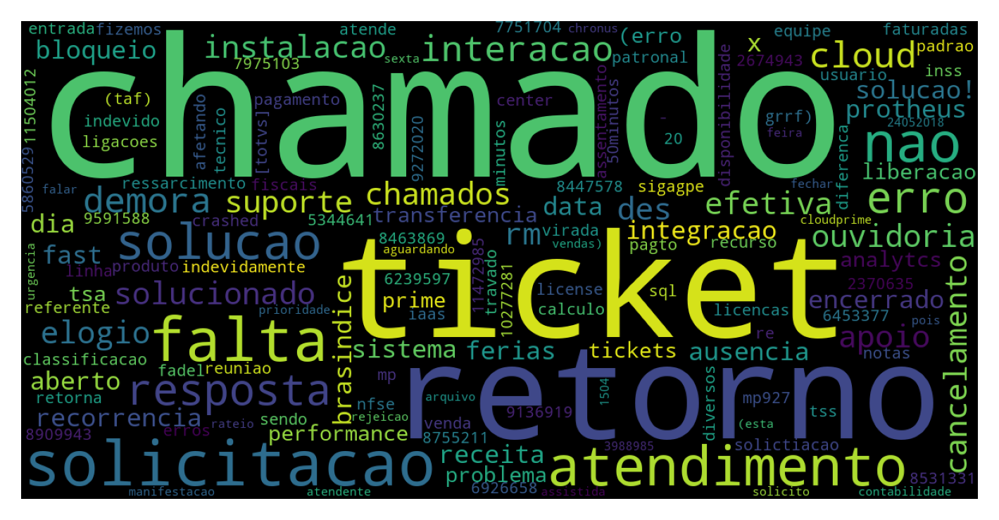

In [154]:
_, freq_words = wordcloud(df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['nome_grupo_fe']=='OUVIDORIA') & ( (df_zd_churn_top['porte_mrr']=='MRR > 50K') | (df_zd_churn_top['porte_mrr']=='10K < MRR <= 50K') ) ], 'titulo_ticket')

In [155]:
freq_words

,word,freq
18,chamado,45
20,ticket,22
27,retorno,18
0,solicitacao,13
11,falta,12
25,atendimento,10
26,nao,10
12,solucao,8
13,erro,6
9,resposta,6


**tipo ticket**

Ver a questao tambem

In [156]:
df_zendesk['tipo_ticket'].value_counts()

QUESTION    7744766
SEM DADO    3742344
TASK         484299
PROBLEM      275662
INCIDENT     268780
Name: tipo_ticket, dtype: int64

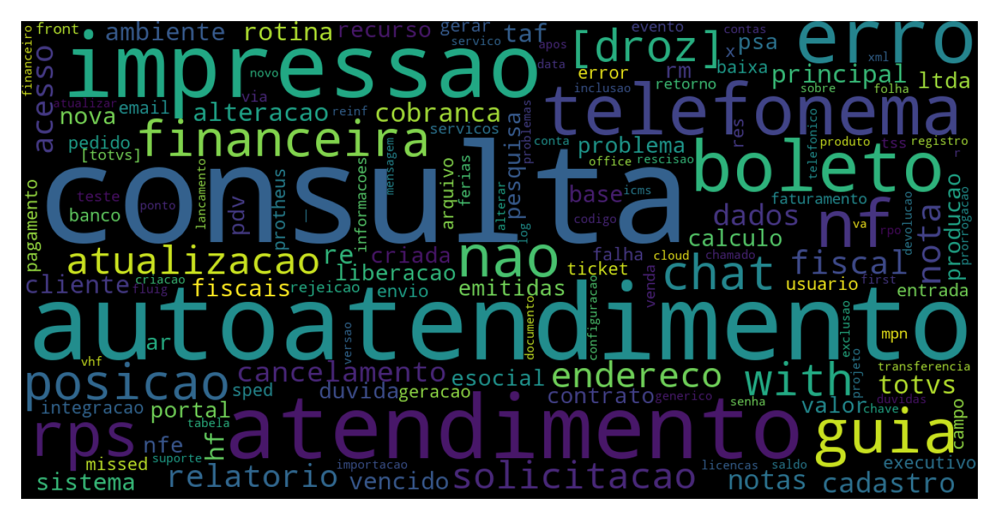

In [184]:
_, freq_words = wordcloud(df_zendesk.loc[ (df_zendesk['tipo_ticket']=='QUESTION') ], 'titulo_ticket')

In [ ]:
freq_words

In [157]:
df_zd_churn_top['tipo_ticket'].value_counts()

QUESTION    537955
TASK         56125
PROBLEM      36196
INCIDENT     25455
SEM DADO     14620
Name: tipo_ticket, dtype: int64

In [158]:
df_zd_churn_top.loc[df_zd_churn_top['motivo_pai']=='Comercial']['tipo_ticket'].value_counts()

QUESTION    44383
TASK         5233
PROBLEM      2653
INCIDENT     1839
SEM DADO      965
Name: tipo_ticket, dtype: int64

In [159]:
df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['porte_mrr']=='MRR > 50K') ]['tipo_ticket'].value_counts()

QUESTION    27030
TASK         3141
PROBLEM      1472
INCIDENT      907
SEM DADO      413
Name: tipo_ticket, dtype: int64

In [160]:
df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['porte_mrr']=='10K < MRR <= 50K') ]['tipo_ticket'].value_counts()

QUESTION    8290
TASK        1154
PROBLEM      748
INCIDENT     515
SEM DADO     308
Name: tipo_ticket, dtype: int64

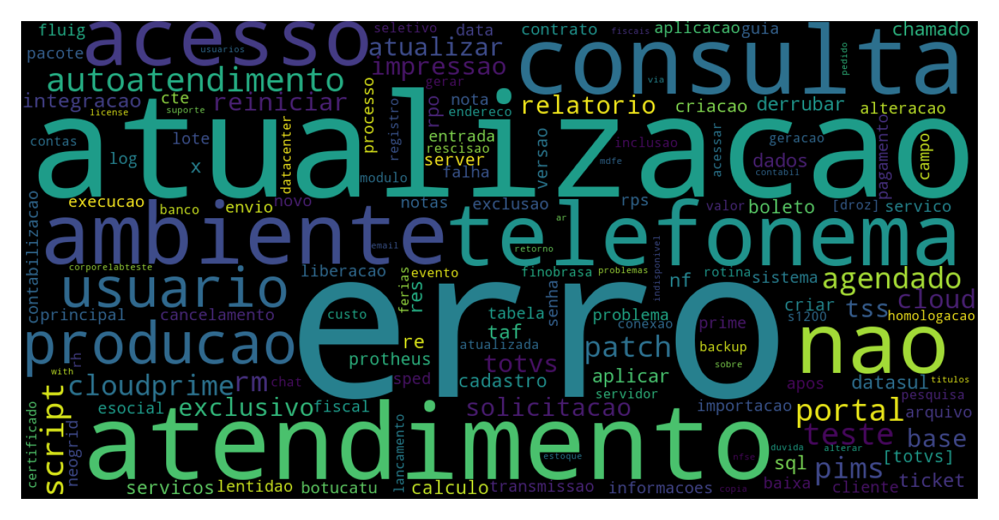

In [185]:
_, freq_words = wordcloud(df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['porte_mrr']=='10K < MRR <= 50K') & (df_zendesk['tipo_ticket']=='QUESTION') ], 'titulo_ticket')

In [ ]:
freq_words

**prioridade ticket**

In [161]:
df_zendesk['prioridade_ticket'].value_counts()

NORMAL      3966312
SEM DADO    3720513
LOW         2917405
HIGH        1177583
URGENT       734038
Name: prioridade_ticket, dtype: int64

In [162]:
df_zd_churn_top['prioridade_ticket'].value_counts()  # temos uma proporção de chamados urgentes maior no top chamados

NORMAL      250923
LOW         228459
URGENT      100131
HIGH         76444
SEM DADO     14394
Name: prioridade_ticket, dtype: int64

In [163]:
# mas quando passamos para o comercial, isso normaliza, o que nos leva a crer, que o problema não esta no motivo 'comercial'
df_zd_churn_top.loc[df_zd_churn_top['motivo_pai']=='Comercial']['prioridade_ticket'].value_counts()

LOW         22422
NORMAL      19969
HIGH         6948
URGENT       4783
SEM DADO      951
Name: prioridade_ticket, dtype: int64

In [164]:
df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['porte_mrr']=='MRR > 50K') ]['prioridade_ticket'].value_counts()

LOW         16872
NORMAL      10056
HIGH         4155
URGENT       1471
SEM DADO      409
Name: prioridade_ticket, dtype: int64

In [165]:
df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['porte_mrr']=='10K < MRR <= 50K') ]['prioridade_ticket'].value_counts()  # porem aqui temos muitos chamados urgentes abertos

NORMAL      5025
LOW         2894
URGENT      1530
HIGH        1266
SEM DADO     300
Name: prioridade_ticket, dtype: int64

In [166]:
df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['porte_mrr']=='10K < MRR <= 50K') & (df_zd_churn_top['nome_grupo_fe']=='OUVIDORIA')]['prioridade_ticket'].value_counts()

NORMAL      81
SEM DADO    20
LOW          1
Name: prioridade_ticket, dtype: int64

In [167]:
df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['porte_mrr']=='10K < MRR <= 50K') & (df_zd_churn_top['nome_grupo_fe']=='CLOUD')]['prioridade_ticket'].value_counts()

NORMAL      2562
LOW         1127
URGENT       423
HIGH         240
SEM DADO      84
Name: prioridade_ticket, dtype: int64

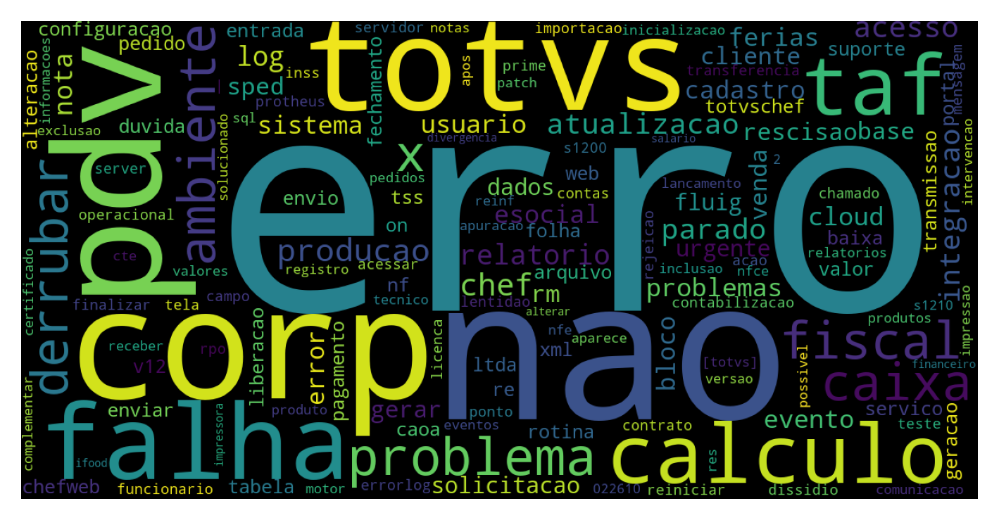

In [168]:
_, freq_words = wordcloud(df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['prioridade_ticket']=='URGENT') ], 'titulo_ticket')

In [169]:
freq_words

,word,freq
0,erro,1236
15,nao,380
1421,corp,213
124,pdv,194
2,totvs,149
159,falha,145
505,calculo,143
931,taf,142
175,problema,142
26,fiscal,136


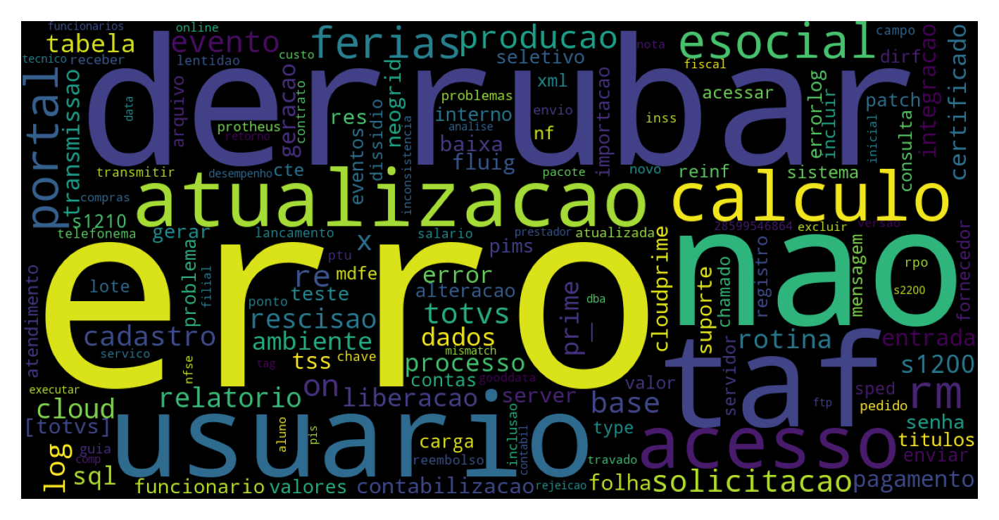

In [170]:
_, freq_words = wordcloud(df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['prioridade_ticket']=='URGENT') & (df_zd_churn_top['porte_mrr']=='10K < MRR <= 50K') ], 'titulo_ticket')

In [171]:
freq_words

,word,freq
17,erro,346
1559,derrubar,114
24,nao,101
58,taf,55
672,usuario,50
48,atualizacao,48
222,acesso,46
18,calculo,40
171,esocial,39
679,portal,37


**status ticket**

In [172]:
df_zendesk['status_ticket'].value_counts(normalize=True)

CLOSED      0.694108
SEM DADO    0.292711
SOLVED      0.005446
DELETED     0.002903
HOLD        0.002376
PENDING     0.001357
OPEN        0.000899
NEW         0.000200
Name: status_ticket, dtype: float64

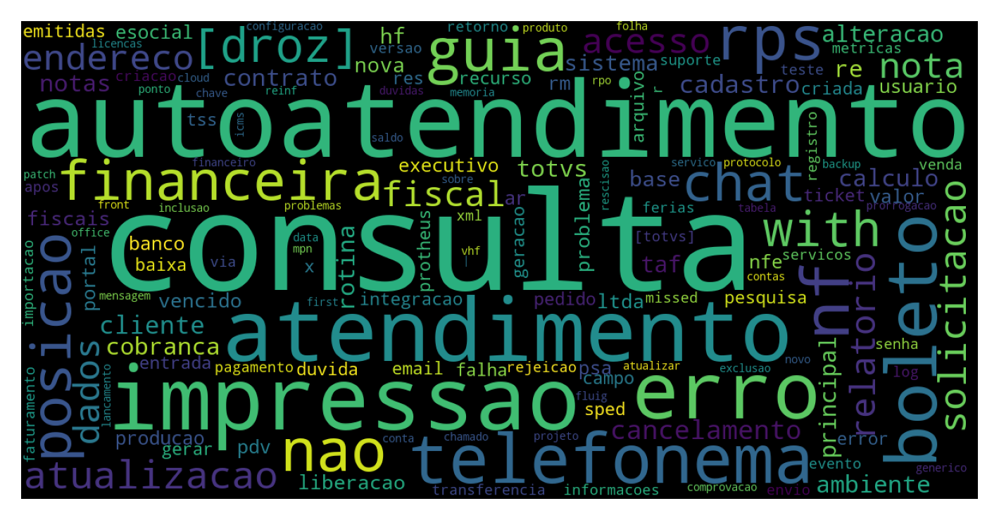

In [173]:
_, freq_words = wordcloud(df_zendesk.loc[df_zendesk['status_ticket']=='CLOSED'], 'titulo_ticket')

In [174]:
freq_words

,word,freq
59,consulta,1752559
241,autoatendimento,1350033
242,impressao,890401
32,atendimento,874607
44,erro,718326
12,boleto,554254
33,telefonema,520701
470,nf,469136
2157,rps,408348
3273,guia,400521


parcela muito alta de chamados encerrado, sera que estao encerrando mesmo com o problema nao resolvido?

In [175]:
df_zd_churn_top['status_ticket'].value_counts(normalize=True)

CLOSED      0.955034
SEM DADO    0.021170
SOLVED      0.010366
HOLD        0.007882
PENDING     0.003592
OPEN        0.001499
DELETED     0.000307
NEW         0.000149
Name: status_ticket, dtype: float64

In [176]:
df_zd_churn_top.loc[df_zd_churn_top['motivo_pai']=='Comercial']['status_ticket'].value_counts(normalize=True)

CLOSED      0.961887
SEM DADO    0.017159
SOLVED      0.011131
HOLD        0.005829
PENDING     0.002506
OPEN        0.001217
DELETED     0.000254
NEW         0.000018
Name: status_ticket, dtype: float64

In [177]:
df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['porte_mrr']=='MRR > 50K') ]['status_ticket'].value_counts(normalize=True)

CLOSED      0.970391
SEM DADO    0.012287
SOLVED      0.011862
HOLD        0.002457
PENDING     0.001669
OPEN        0.001031
DELETED     0.000273
NEW         0.000030
Name: status_ticket, dtype: float64

In [178]:
df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['porte_mrr']=='10K < MRR <= 50K') ]['status_ticket'].value_counts(normalize=True)

CLOSED      0.954698
SEM DADO    0.027054
SOLVED      0.007354
HOLD        0.005992
PENDING     0.003450
OPEN        0.001271
DELETED     0.000182
Name: status_ticket, dtype: float64

In [179]:
df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['porte_mrr']=='10K < MRR <= 50K') & (df_zd_churn_top['nome_grupo_fe']=='OUVIDORIA')]['status_ticket'].value_counts()

CLOSED      81
SEM DADO    20
SOLVED       1
Name: status_ticket, dtype: int64

In [180]:
df_zd_churn_top.loc[ (df_zd_churn_top['motivo_pai']=='Comercial') & (df_zd_churn_top['porte_mrr']=='10K < MRR <= 50K') & (df_zd_churn_top['nome_grupo_fe']=='CLOUD')]['status_ticket'].value_counts()

CLOSED      4295
SEM DADO      83
SOLVED        32
PENDING       19
OPEN           3
HOLD           3
DELETED        1
Name: status_ticket, dtype: int64

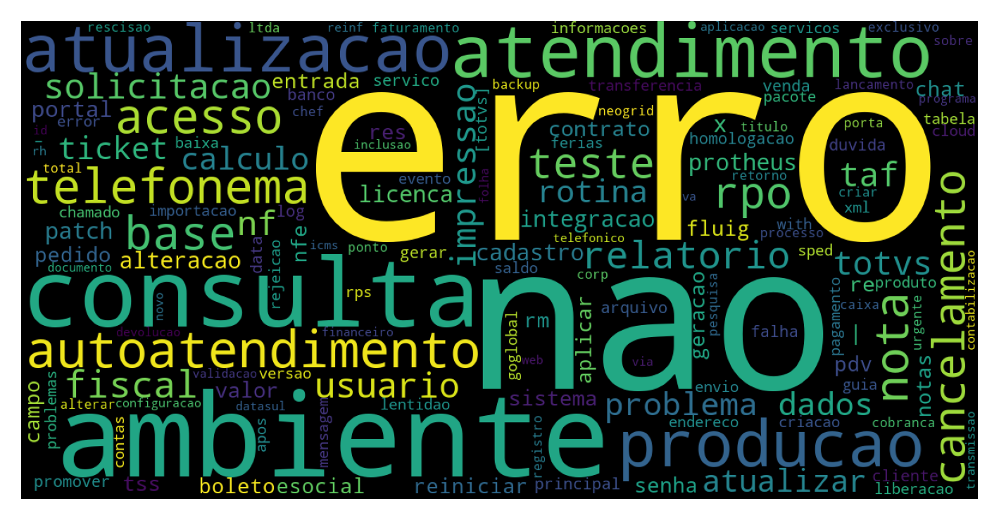

In [181]:
_, freq_words = wordcloud(df_zd_churn_top.loc[df_zd_churn_top['status_ticket']=='CLOSED'], 'titulo_ticket')

In [182]:
freq_words

,word,freq
22,erro,84544
46,nao,43659
1019,ambiente,27293
9,consulta,24973
5,atendimento,23930
292,atualizacao,21062
197,producao,20136
10,autoatendimento,18112
6,telefonema,16080
39,acesso,15479
